In [ ]:
!pip install geopandas

     |████████████████████████████████| 994 kB 4.8 MB/s 
     |████████████████████████████████| 6.6 MB 19.0 MB/s 
     |████████████████████████████████| 15.4 MB 32 kB/s 


Import the Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import branca.colormap as cm
import folium
import geopandas as gpd
from shapely.geometry import Point, Polygon
import descartes
import warnings



In [ ]:
warnings.filterwarnings("ignore")
sns.set(style="darkgrid")
# Set the color palette
sns.set_palette(sns.color_palette("dark"))
pd.options.display.float_format = '{:.1f}'.format

Load the Dataset which can be downloaded by clicking [this link](https://covid.ourworldindata.org/data/owid-covid-data.csv)

In [ ]:
df = pd.read_csv("/content/owid-covid-data_June.csv")

df.tail()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,new_deaths_per_million,new_deaths_smoothed_per_million,reproduction_rate,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,new_tests,total_tests,total_tests_per_thousand,new_tests_per_thousand,new_tests_smoothed,new_tests_smoothed_per_thousand,positive_rate,tests_per_case,tests_units,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,new_vaccinations_smoothed,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,new_vaccinations_smoothed_per_million,stringency_index,population,population_density,median_age,aged_65_older,aged_70_older,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,excess_mortality
97580,ZWE,Africa,Zimbabwe,2021-06-18,41335.0,408.0,235.3,1656.0,9.0,3.9,2781.1,27.5,15.8,111.4,0.6,0.3,1.8,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,1131397.0,700244.0,431153.0,5310.0,4935.0,7.6,4.7,2.9,332.0,67.6,14862927.0,42.7,19.6,2.8,1.9,1899.8,21.4,307.8,1.8,1.6,30.7,36.8,1.7,61.5,0.6,nan
97581,ZWE,Africa,Zimbabwe,2021-06-19,41628.0,293.0,253.7,1666.0,10.0,4.9,2800.8,19.7,17.1,112.1,0.7,0.3,1.8,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,1133920.0,701348.0,432572.0,2523.0,4360.0,7.6,4.7,2.9,293.0,67.6,14862927.0,42.7,19.6,2.8,1.9,1899.8,21.4,307.8,1.8,1.6,30.7,36.8,1.7,61.5,0.6,nan
97582,ZWE,Africa,Zimbabwe,2021-06-20,41779.0,151.0,260.0,1672.0,6.0,5.7,2811.0,10.2,17.5,112.5,0.4,0.4,1.8,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,1138733.0,703065.0,435668.0,4813.0,4525.0,7.7,4.7,2.9,304.0,67.6,14862927.0,42.7,19.6,2.8,1.9,1899.8,21.4,307.8,1.8,1.6,30.7,36.8,1.7,61.5,0.6,nan
97583,ZWE,Africa,Zimbabwe,2021-06-21,42195.0,416.0,302.6,1685.0,13.0,7.1,2838.9,28.0,20.4,113.4,0.9,0.5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,1140852.0,704001.0,436851.0,2119.0,4664.0,7.7,4.7,2.9,314.0,67.6,14862927.0,42.7,19.6,2.8,1.9,1899.8,21.4,307.8,1.8,1.6,30.7,36.8,1.7,61.5,0.6,nan
97584,ZWE,Africa,Zimbabwe,2021-06-22,42714.0,519.0,342.3,1691.0,6.0,7.7,2873.9,34.9,23.0,113.8,0.4,0.5,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,NaN,1146378.0,706158.0,440220.0,5526.0,4700.0,7.7,4.8,3.0,316.0,nan,14862927.0,42.7,19.6,2.8,1.9,1899.8,21.4,307.8,1.8,1.6,30.7,36.8,1.7,61.5,0.6,nan


In [ ]:
df.shape

(97585, 60)

Drop the unwanted Columns.

In [ ]:
#Drop unwanted columns 
df.drop(columns=['new_cases_smoothed', 'new_deaths_smoothed', 'new_cases_smoothed_per_million', 
                      'new_deaths_smoothed_per_million', 'reproduction_rate', 'weekly_icu_admissions_per_million', 
                      'weekly_hosp_admissions_per_million', 'new_tests', 'total_tests', 'total_tests_per_thousand', 
                      'new_tests_per_thousand', 'new_tests_smoothed', 'new_tests_smoothed_per_thousand', 'positive_rate', 
                      'tests_per_case', 'tests_units', 'new_vaccinations_smoothed', 'new_vaccinations_smoothed_per_million', 'aged_65_older', 
                      'aged_70_older','icu_patients','icu_patients_per_million','weekly_icu_admissions', 'cardiovasc_death_rate', 'diabetes_prevalence', 'female_smokers', 
                      'male_smokers', 'handwashing_facilities', 'life_expectancy','excess_mortality'], inplace=True) 

Check for missing Values:


In [ ]:
# Check for missing values
df.apply(lambda x: sum(x.isnull()),axis=0) 

iso_code                                   0
continent                               4588
location                                   0
date                                       0
total_cases                             3413
new_cases                               3416
total_deaths                           13482
new_deaths                             13326
total_cases_per_million                 3915
new_cases_per_million                   3918
total_deaths_per_million               13971
new_deaths_per_million                 13815
hosp_patients                          85408
hosp_patients_per_million              85408
weekly_hosp_admissions                 96057
total_vaccinations                     82087
people_vaccinated                      82864
people_fully_vaccinated                85695
new_vaccinations                       84651
total_vaccinations_per_hundred         82087
people_vaccinated_per_hundred          82864
people_fully_vaccinated_per_hundred    85695
stringency

Replace Missing Values with Zeros

In [ ]:
df.update(df[['continent','total_cases','new_cases','total_deaths','new_deaths','total_cases_per_million','new_cases_per_million','total_deaths_per_million',
              'new_deaths_per_million','hosp_patients','hosp_patients_per_million',
              'weekly_hosp_admissions','total_vaccinations','people_vaccinated','people_fully_vaccinated','new_vaccinations','total_vaccinations_per_hundred',
              'people_vaccinated_per_hundred','people_fully_vaccinated_per_hundred','gdp_per_capita','extreme_poverty', 'stringency_index','population','population_density','median_age',
              'hospital_beds_per_thousand','human_development_index']].fillna(0))


Rename Columns

In [ ]:
df = df.rename(columns={'location':'country'})


Inaccurate Data

In [ ]:
flt =(df['country'] == 'Asia')
df[flt].head()

,iso_code,continent,country,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index
4593,OWID_ASI,0,Asia,2020-01-22,556.0,0.0,17.0,0.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4639847425.0,0.0,0.0,0.0,0.0,0.0,0.0
4594,OWID_ASI,0,Asia,2020-01-23,654.0,98.0,18.0,1.0,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4639847425.0,0.0,0.0,0.0,0.0,0.0,0.0
4595,OWID_ASI,0,Asia,2020-01-24,937.0,283.0,26.0,8.0,0.2,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4639847425.0,0.0,0.0,0.0,0.0,0.0,0.0
4596,OWID_ASI,0,Asia,2020-01-25,1428.0,491.0,42.0,16.0,0.3,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4639847425.0,0.0,0.0,0.0,0.0,0.0,0.0
4597,OWID_ASI,0,Asia,2020-01-26,2105.0,677.0,56.0,14.0,0.5,0.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4639847425.0,0.0,0.0,0.0,0.0,0.0,0.0


Show the rows that have Country Name as the Continent name

In [ ]:
flt_continent =df.continent == 0
df_nan_continents = df[flt_continent]
df_nan_continents.shape


(4588, 30)

Delete rows with wrong country name.

In [ ]:
df.drop(df_nan_continents.index, axis=0, inplace=True)

Check again for missing values.

In [ ]:
df.apply(lambda x: sum(x.isnull()),axis=0) 

iso_code                               0
continent                              0
country                                0
date                                   0
total_cases                            0
new_cases                              0
total_deaths                           0
new_deaths                             0
total_cases_per_million                0
new_cases_per_million                  0
total_deaths_per_million               0
new_deaths_per_million                 0
hosp_patients                          0
hosp_patients_per_million              0
weekly_hosp_admissions                 0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
new_vaccinations                       0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
stringency_index                       0
population                             0
population_densi

In [ ]:
df.shape

(92997, 30)

## Descriptive Statistics of the data.

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
total_cases,92997.0,327428.0,1765402.1,0.0,812.0,10183.0,106110.0,33565215.0
new_cases,92997.0,1921.4,11275.1,-74347.0,1.0,51.0,607.0,414188.0
total_deaths,92997.0,7923.2,35533.1,0.0,10.0,164.0,1979.0,602462.0
new_deaths,92997.0,41.7,200.4,-1918.0,0.0,1.0,10.0,7374.0
total_cases_per_million,92997.0,12156.5,23276.8,0.0,178.4,1463.8,11891.5,179434.4
new_cases_per_million,92997.0,73.2,199.8,-2153.4,0.0,6.2,63.1,18293.7
total_deaths_per_million,92997.0,237.1,483.4,0.0,2.3,25.4,208.5,5782.1
new_deaths_per_million,92997.0,1.3,3.8,-76.4,0.0,0.0,0.9,218.3
hosp_patients,92997.0,613.6,4605.7,0.0,0.0,0.0,0.0,133214.0
hosp_patients_per_million,92997.0,22.4,96.0,0.0,0.0,0.0,0.0,1532.6


### World and Continent Data Analysis

Calculate world population

In [ ]:
# Create dataframe
population_df =df.groupby('population').max()
population_df.reset_index(inplace=True)

#calculate sum of values
world_total_pop = population_df['population'].sum()

world_total_pop

7764811780.0

In [ ]:
df['continent'].value_counts()

Africa           25143
Asia             23138
Europe           23134
North America    12048
South America     5871
Oceania           3663
Name: continent, dtype: int64

Total number of Cases, Deaths and Vaccinations

Get total number of deaths and cases by continent

In [ ]:
#aggregate for cases and deaths per continent
total_continents_df =df.groupby('continent')['new_cases','new_deaths','new_vaccinations'].sum()

#rename columns
total_continents_df = total_continents_df.rename(columns={'new_cases':'total_cases'})
total_continents_df = total_continents_df.rename(columns={'new_deaths':'total_deaths'})
total_continents_df = total_continents_df.rename(columns={'new_vaccinations':'total_vaccinations'})

total_continents_df

,total_cases,total_deaths,total_vaccinations
continent,,,
Africa,5248147.0,138589.0,22618671.0
Asia,53893918.0,771103.0,1471765396.0
Europe,48172575.0,1096956.0,400907768.0
North America,39465912.0,897128.0,386669965.0
Oceania,52421.0,1119.0,7409319.0
South America,31849486.0,977310.0,137206610.0


In [ ]:
# Sum Of total_cases

total_world_data =total_continents_df.sum()
total_world_data = total_world_data.to_frame()

#add a column for percentage of world population
total_world_data['Percentage_of_World_Population']=total_world_data.apply(lambda x: round(x/world_total_pop*100, 2))
total_world_data= total_world_data.rename(columns={0:'World_Data'})
total_world_data


,World_Data,Percentage_of_World_Population
total_cases,178682459.0,2.3
total_deaths,3882205.0,0.1
total_vaccinations,2426577729.0,31.2


Continents Visualization

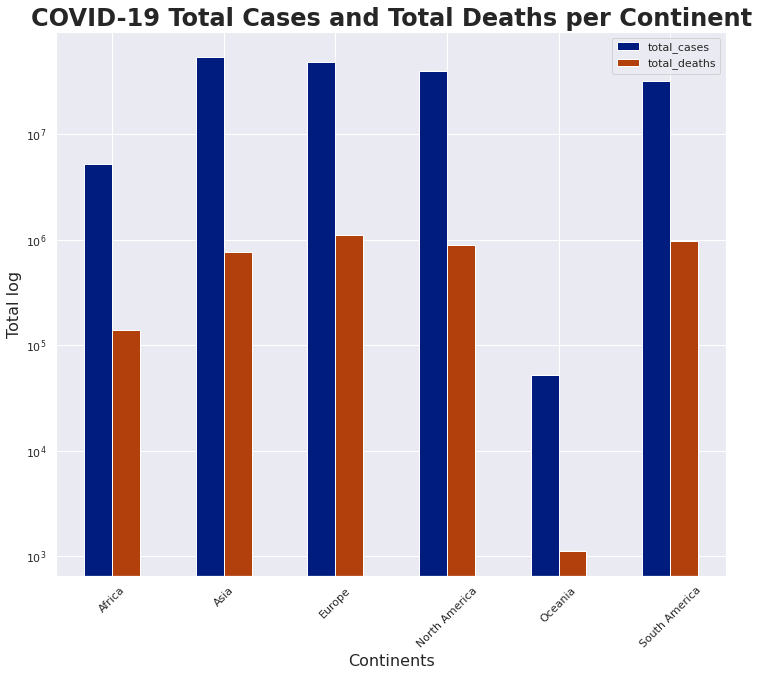

In [ ]:
ax_cont=total_continents_df[['total_cases','total_deaths']].plot(kind='bar',figsize=(12,10),logy=True)
ax_cont.set_title("COVID-19 Total Cases and Total Deaths per Continent",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_cont.set_xlabel('Continents',fontsize = 16, )
ax_cont.set_ylabel('Total log',fontsize = 16)
ax_cont.set_xticklabels(total_continents_df.index, rotation=45 );

Get the total vaccinations

In [ ]:
vaccinations_df =  df.groupby(['continent','country'])['new_vaccinations','people_vaccinated','people_fully_vaccinated','total_vaccinations','total_vaccinations_per_hundred'].max()
vaccinations_df.reset_index(inplace=True)
vaccinations_df

,continent,country,new_vaccinations,people_vaccinated,people_fully_vaccinated,total_vaccinations,total_vaccinations_per_hundred
0,Africa,Algeria,30.0,2500000.0,0.0,2500000.0,5.7
1,Africa,Angola,0.0,866381.0,513793.0,1380174.0,4.2
2,Africa,Benin,0.0,21834.0,4790.0,26624.0,0.2
3,Africa,Botswana,0.0,150019.0,0.0,150019.0,6.4
4,Africa,Burkina Faso,0.0,17775.0,0.0,17775.0,0.1
...,...,...,...,...,...,...,...
216,South America,Paraguay,25234.0,422474.0,240330.0,662804.0,9.3
217,South America,Peru,215242.0,3873064.0,2547799.0,6420863.0,19.5
218,South America,Suriname,9775.0,145832.0,31396.0,177228.0,30.2
219,South America,Uruguay,63636.0,2166810.0,1450749.0,3617559.0,104.1


In [ ]:
cont_vax_df = vaccinations_df.groupby('continent').sum()
cont_vax_df

,new_vaccinations,people_vaccinated,people_fully_vaccinated,total_vaccinations,total_vaccinations_per_hundred
continent,,,,,
Africa,1540907.0,33140870.0,13750083.0,46517539.0,530.7
Asia,42905736.0,1041312190.0,360217254.0,1648830354.0,1645.3
Europe,8237408.0,289678963.0,183966357.0,464022432.0,3603.0
North America,6988381.0,244306106.0,181856235.0,414520633.0,1794.8
Oceania,206514.0,6813289.0,1610682.0,8418995.0,603.9
South America,5023154.0,114415754.0,49397869.0,163595174.0,599.5


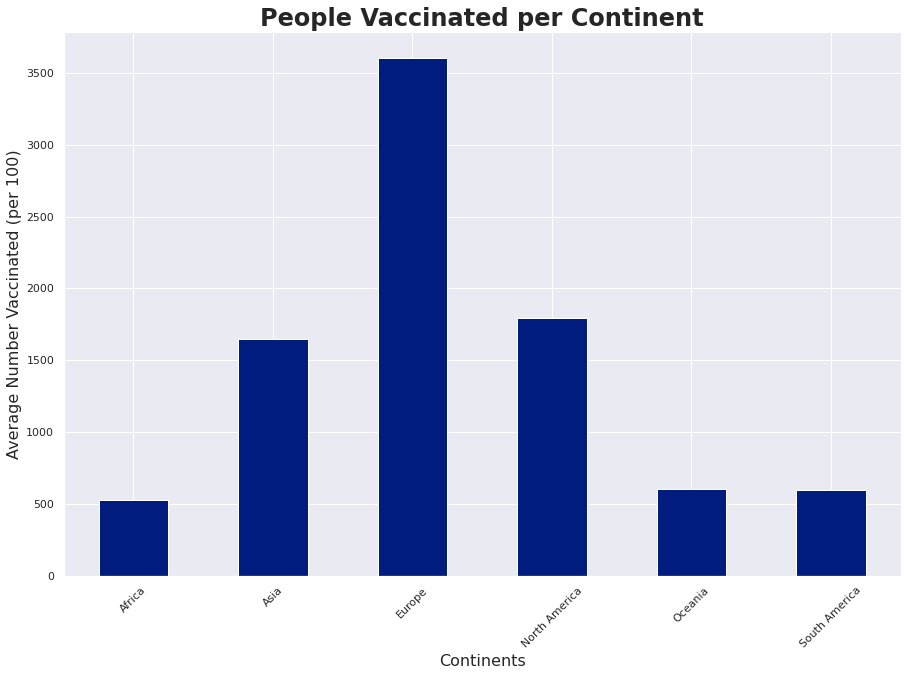

In [ ]:
ax_cont=cont_vax_df['total_vaccinations_per_hundred'].plot(kind='bar',figsize=(15,10),logy=False)
ax_cont.set_title("People Vaccinated per Continent",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_cont.set_xlabel('Continents',fontsize = 16, )
ax_cont.set_ylabel('Average Number Vaccinated (per 100)',fontsize = 16)
ax_cont.set_xticklabels(total_continents_df.index, rotation=45 );

GEOPANDAS


Use geopandas to Visualize the Covid Dataset


In [ ]:
# World Shapefile
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.head()

,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,920938,Oceania,Fiji,FJI,8374.0,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,53950935,Africa,Tanzania,TZA,150600.0,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253,Africa,W. Sahara,ESH,906.5,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,35623680,North America,Canada,CAN,1674000.0,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,326625791,North America,United States of America,USA,18560000.0,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


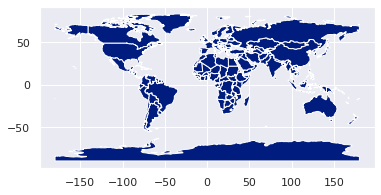

In [ ]:
#Basic plot, random colors
world.plot();

In [ ]:
type(world)

geopandas.geodataframe.GeoDataFrame

In [ ]:
# Dropped the Pop_est & gdp_md_est columns in the World Shapefile as we will not be using them
world = world.drop(columns=['pop_est','gdp_md_est'])
world.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   continent  177 non-null    object  
 1   name       177 non-null    object  
 2   iso_a3     177 non-null    object  
 3   geometry   177 non-null    geometry
dtypes: geometry(1), object(3)
memory usage: 5.7+ KB


In [ ]:
# Rename columns to match the covid dataset columns
world = world.rename(columns={'iso_a3':'iso_code'})

world.info()


<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 177 entries, 0 to 176
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype   
---  ------     --------------  -----   
 0   continent  177 non-null    object  
 1   name       177 non-null    object  
 2   iso_code   177 non-null    object  
 3   geometry   177 non-null    geometry
dtypes: geometry(1), object(3)
memory usage: 5.7+ KB


Merge world shapefile to covid dataset

In [ ]:
# Merge shapefile with dataset -- Combined dataset is geo_df
geo_df  = df.merge(world, on='iso_code', how='left')
geo_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 92997 entries, 0 to 92996
Data columns (total 33 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   iso_code                             92997 non-null  object  
 1   continent_x                          92997 non-null  object  
 2   country                              92997 non-null  object  
 3   date                                 92997 non-null  object  
 4   total_cases                          92997 non-null  float64 
 5   new_cases                            92997 non-null  float64 
 6   total_deaths                         92997 non-null  float64 
 7   new_deaths                           92997 non-null  float64 
 8   total_cases_per_million              92997 non-null  float64 
 9   new_cases_per_million                92997 non-null  float64 
 10  total_deaths_per_million             92997 non-null  float64 
 11  new_deaths_per_

In [ ]:
geo_df.head()

,iso_code,continent_x,country,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index,continent_y,name,geometry
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.3,38928341.0,54.4,18.6,1804.0,0.0,0.5,0.5,Asia,Afghanistan,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.3,38928341.0,54.4,18.6,1804.0,0.0,0.5,0.5,Asia,Afghanistan,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.3,38928341.0,54.4,18.6,1804.0,0.0,0.5,0.5,Asia,Afghanistan,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.3,38928341.0,54.4,18.6,1804.0,0.0,0.5,0.5,Asia,Afghanistan,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.3,38928341.0,54.4,18.6,1804.0,0.0,0.5,0.5,Asia,Afghanistan,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."


In [ ]:
type(geo_df)

pandas.core.frame.DataFrame

In [ ]:
# Convert pandas dataframe to geodataframe
geo_df = gpd.GeoDataFrame(geo_df, geometry='geometry')


In [ ]:
type(geo_df)

geopandas.geodataframe.GeoDataFrame

In [ ]:
# Convert Date to unix time in nanoseconds:

geo_df['date_sec'] = pd.to_datetime(geo_df['date']).astype(int) // 10**9
geo_df['date_sec'] = geo_df['date_sec'].astype(int).astype(str)

#geo_df

In [ ]:
# Select columns needed for the map

timeseries_df = geo_df[['country', 'date_sec', 'total_cases', 'geometry']]


timeseries_df.head()

,country,date_sec,total_cases,geometry
0,Afghanistan,1582502400,1.0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
1,Afghanistan,1582588800,1.0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
2,Afghanistan,1582675200,1.0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
3,Afghanistan,1582761600,1.0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
4,Afghanistan,1582848000,1.0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."


In [ ]:
type(timeseries_df)

geopandas.geodataframe.GeoDataFrame

In [ ]:
# Initialize the map Tile

mymap = folium.Map(tiles='cartodbpositron')
mymap.save(outfile='infinite_scroll.html')

mymap_fix_boundary = folium.Map(min_zoom=10, max_bounds=True, tiles='cartodbpositron')
mymap_fix_boundary.save(outfile='fix_boundary.html')

max_colour = max(timeseries_df['total_cases'])
min_colour = min(timeseries_df['total_cases'])
cmap = cm.linear.YlOrRd_09.scale(min_colour, max_colour)
timeseries_df['colour'] = timeseries_df['total_cases'].map(cmap)

In [ ]:
country_list = timeseries_df['country'].unique().tolist()
country_idx = range(len(country_list))

style_dict = {}
for i in country_idx:
    country = country_list[i]
    result = timeseries_df[timeseries_df['country'] == country]
    inner_dict = {}
    for _, r in result.iterrows():
        inner_dict[r['date_sec']] = {'color': r['colour'], 'opacity': 0.7}
    style_dict[str(i)] = inner_dict

In [ ]:
countries_df = timeseries_df[['geometry']]
countries_gdf = gpd.GeoDataFrame(countries_df)
countries_gdf = countries_gdf.drop_duplicates().reset_index()

countries_gdf

,index,geometry
0,0,"POLYGON ((66.51861 37.36278, 67.07578 37.35614..."
1,485,"POLYGON ((21.02004 40.84273, 20.99999 40.58000..."
2,969,"POLYGON ((-8.68440 27.39574, -8.66512 27.58948..."
3,1453,None
4,1931,"MULTIPOLYGON (((12.99552 -4.78110, 12.63161 -4..."
...,...,...
163,90562,"POLYGON ((-60.73357 5.20028, -60.60118 4.91810..."
164,91028,"POLYGON ((104.33433 10.48654, 105.19991 10.889..."
165,91636,"POLYGON ((52.00001 19.00000, 52.78218 17.34974..."
166,92075,"POLYGON ((30.74001 -8.34001, 31.15775 -8.59458..."


In [ ]:
from folium.plugins import TimeSliderChoropleth

slider_map = folium.Map(min_zoom=2, max_bounds=True,tiles='cartodbpositron')

_ = TimeSliderChoropleth(
    data=countries_gdf.to_json(),
    styledict=style_dict,

).add_to(slider_map)

_ = cmap.add_to(slider_map)
cmap.caption = "Log of number of Covid Total cases"
slider_map.save(outfile='TotalCasesTimeSliderChoropleth.html')

slider_map

In [ ]:
geo_df['continent_x'].unique()

array(['Asia', 'Europe', 'Africa', 'North America', 'South America',
       'Oceania'], dtype=object)

Visualize the data

In [ ]:
# Filter data for date == 2021-06-01
flt =(geo_df['date'] == '2021-06-22')
june_df= geo_df[flt].sort_values(by='total_cases',  ascending=False, inplace=False)
june_df



,iso_code,continent_x,country,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index,continent_y,name,geometry,date_sec
88930,USA,North America,United States,2021-06-22,33565215.0,10940.0,602462.0,370.0,101404.7,33.1,1820.1,1.1,0.0,0.0,0.0,319223844.0,177635067.0,150424675.0,647403.0,95.5,53.1,45.0,0.0,331002647.0,35.6,38.3,54225.4,1.2,2.8,0.9,North America,United States of America,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",1624320000
38816,IND,Asia,India,2021-06-22,30028709.0,50848.0,390660.0,1358.0,21759.9,36.8,283.1,1.0,0.0,0.0,0.0,289855456.0,238586187.0,51269269.0,6541514.0,21.0,17.3,3.7,0.0,1380004385.0,450.4,28.2,6426.7,21.2,0.5,0.6,Asia,India,"POLYGON ((97.32711 28.26158, 97.40256 27.88254...",1624320000
11877,BRA,South America,Brazil,2021-06-22,18054653.0,87822.0,504717.0,2131.0,84939.3,413.2,2374.5,10.0,0.0,0.0,0.0,90077011.0,65339660.0,24737351.0,1723948.0,42.4,30.7,11.6,0.0,212559409.0,25.0,33.5,14103.5,3.4,2.2,0.8,South America,Brazil,"POLYGON ((-53.37366 -33.76838, -53.65054 -33.2...",1624320000
30077,FRA,Europe,France,2021-06-22,5821797.0,2213.0,110991.0,51.0,86166.8,32.8,1642.7,0.8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67564251.0,122.6,42.0,38605.7,0.0,6.0,0.9,NaN,NaN,None,1624320000
86245,TUR,Asia,Turkey,2021-06-22,5381736.0,6143.0,49293.0,57.0,63810.7,72.8,584.5,0.7,0.0,0.0,0.0,44080123.0,29462165.0,14617958.0,450944.0,52.3,34.9,17.3,0.0,84339067.0,104.9,31.6,25129.3,0.2,2.8,0.8,Asia,Turkey,"MULTIPOLYGON (((44.77268 37.17044, 44.29345 37...",1624320000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40902,IMN,Europe,Isle of Man,2021-06-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,97379.0,62418.0,34961.0,0.0,114.5,73.4,41.1,0.0,85032.0,147.9,0.0,0.0,0.0,0.0,0.0,NaN,NaN,None,1624320000
4096,ABW,North America,Aruba,2021-06-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,124332.0,67004.0,57328.0,19.0,116.5,62.8,53.7,0.0,106766.0,584.8,41.2,35973.8,0.0,0.0,0.0,NaN,NaN,None,1624320000
50202,MAC,Asia,Macao,2021-06-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,302379.0,213450.0,90235.0,5562.0,46.6,32.9,13.9,0.0,649342.0,20546.8,39.2,104861.9,0.0,0.0,0.0,NaN,NaN,None,1624320000
21205,CUW,North America,Curacao,2021-06-22,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,164881.0,88174.0,76707.0,300.0,100.5,53.7,46.7,0.0,164100.0,362.6,41.7,0.0,0.0,0.0,0.0,NaN,NaN,None,1624320000


In [ ]:
type(june_df)

geopandas.geodataframe.GeoDataFrame

In [ ]:
# Create dataframe for the Total Cases

june_total_cases_df = june_df[['iso_code','country','total_cases','total_cases_per_million','geometry']]


In [ ]:
# Convert pandas dataframe to geodataframe
june_total_cases_df = gpd.GeoDataFrame(june_total_cases_df, geometry='geometry')


Total COVID-19 Cases

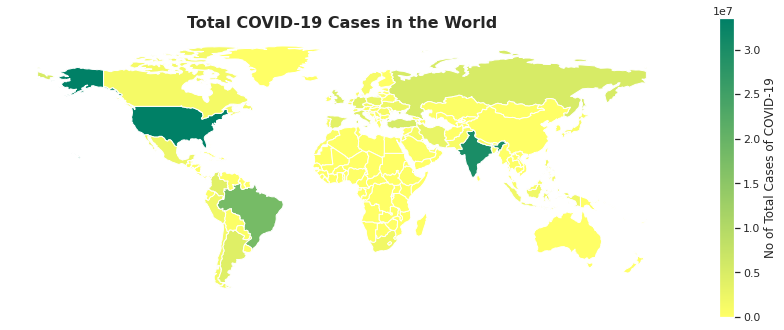

In [ ]:
# Generate the choropleth map using gdf plot function on the Total Cases

columnfig = june_total_cases_df.plot(column='total_cases',cmap='summer_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of Total Cases of COVID-19",'orientation': "vertical", 'shrink': 0.55})

# Removing axis ticks
plt.axis('off')

# Add the title
plt.title("Total COVID-19 Cases in the World",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

In [ ]:
# Individual continents

asia = june_df[june_df['continent_x'] == 'Asia']
africa = june_df[june_df['continent_x'] == 'Africa']
north_america = june_df[june_df['continent_x'] == 'North America']
europe = june_df[june_df['continent_x'] == 'Europe']
south_america = june_df[june_df['continent_x'] == 'South America']

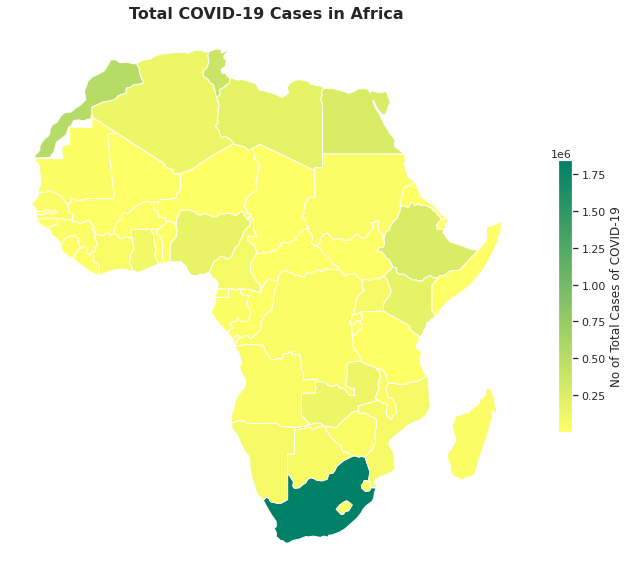

In [ ]:
map_africa = africa.plot(column='total_cases',cmap='summer_r',figsize=(12,10), legend = True,
                                legend_kwds={'label': "No of Total Cases of COVID-19",'orientation': "vertical", 'shrink': 0.5})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total COVID-19 Cases in Africa",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

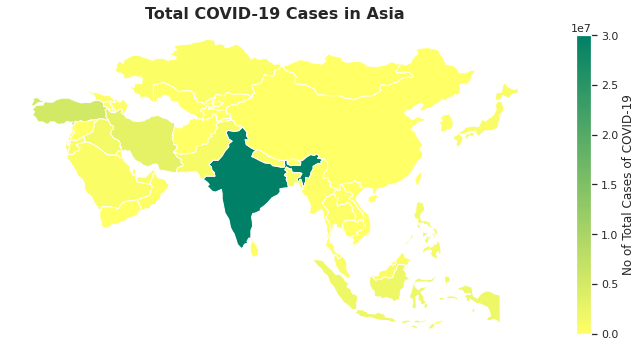

In [ ]:
map_asia = asia.plot(column='total_cases',cmap='summer_r',figsize=(12,10), legend = True,
                                legend_kwds={'label': "No of Total Cases of COVID-19",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total COVID-19 Cases in Asia",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

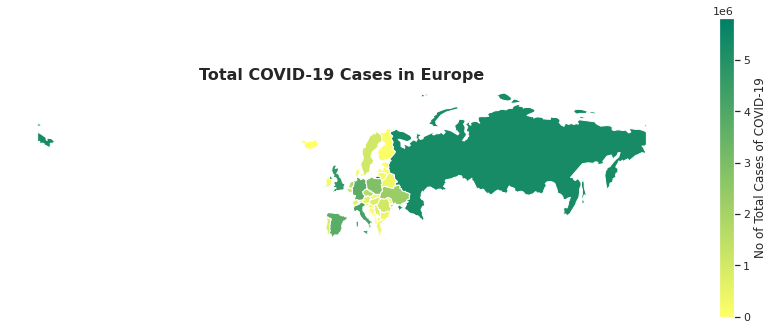

In [ ]:
map_europe = europe.plot(column='total_cases',cmap='summer_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of Total Cases of COVID-19",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total COVID-19 Cases in Europe",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

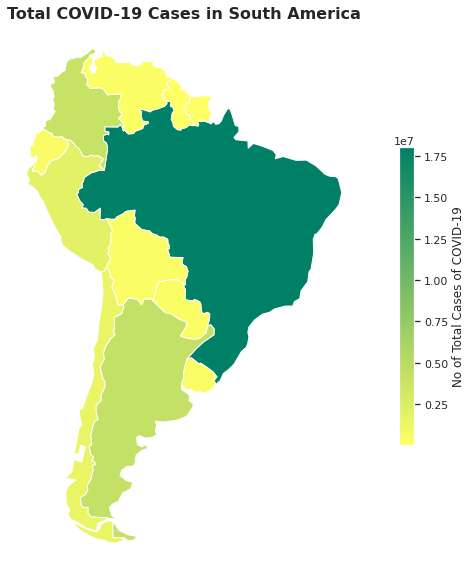

In [ ]:
map_south_america = south_america.plot(column='total_cases',cmap='summer_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of Total Cases of COVID-19",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total COVID-19 Cases in South America",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

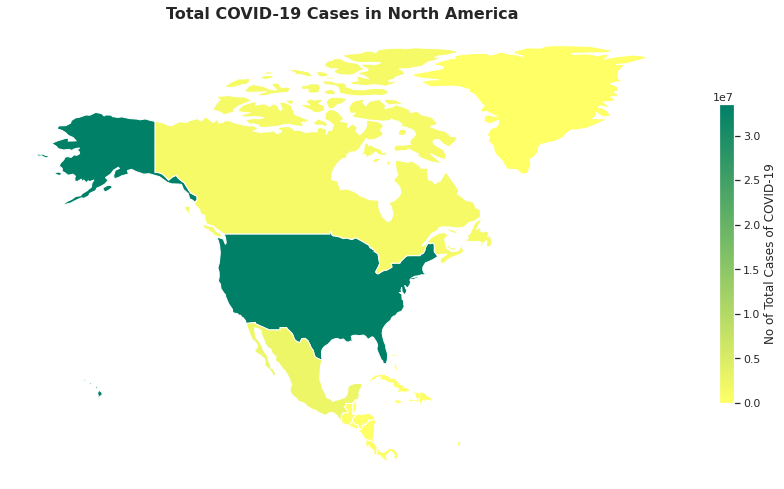

In [ ]:
map_north_america = north_america.plot(column='total_cases',cmap='summer_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of Total Cases of COVID-19",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total COVID-19 Cases in North America",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

 Total Deaths

In [ ]:
#Create a dataframe

june_deaths_df = june_df[['iso_code','country','total_deaths','total_deaths_per_million','geometry']]


In [ ]:
june_deaths_df = gpd.GeoDataFrame(june_deaths_df, geometry='geometry')

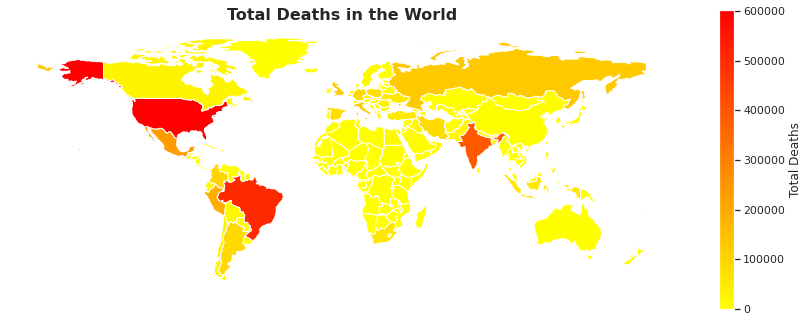

In [ ]:
#Generate the choropleth map using gdf plot function on the Total Deaths 

columnfig = june_deaths_df.plot(column='total_deaths',cmap='autumn_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Deaths", 'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Deaths in the World",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

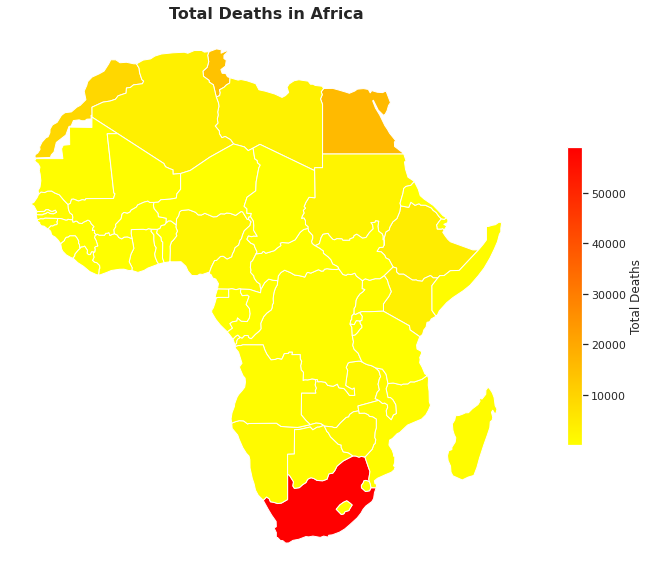

In [ ]:
# Continents Total Deaths

map_africa = africa.plot(column='total_deaths',cmap='autumn_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Deaths",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Deaths in Africa",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

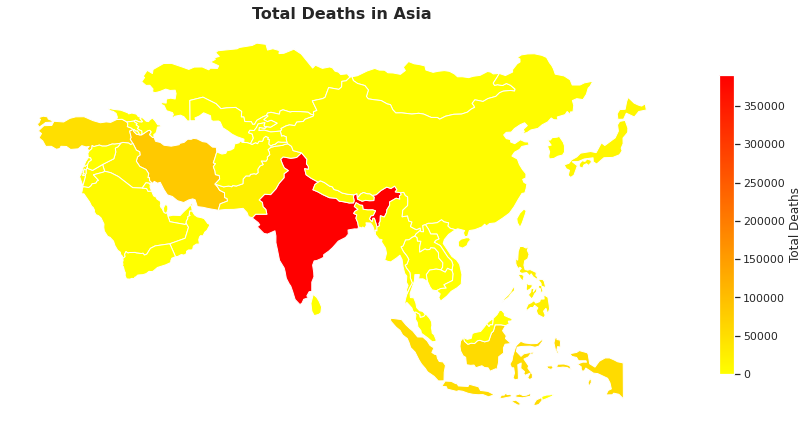

In [ ]:
map_asia = asia.plot(column='total_deaths',cmap='autumn_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Deaths",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Deaths in Asia",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

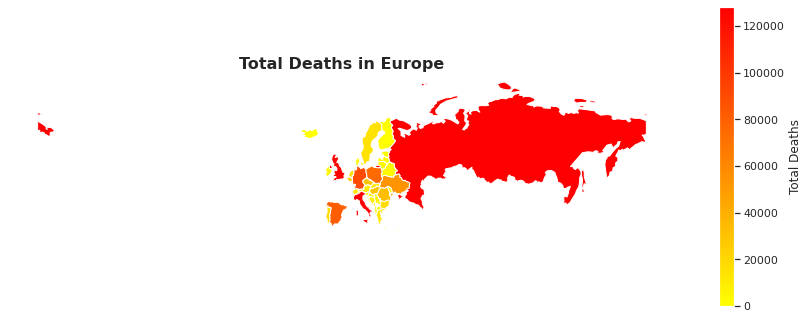

In [ ]:
map_europe = europe.plot(column='total_deaths',cmap='autumn_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Deaths",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Deaths in Europe",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

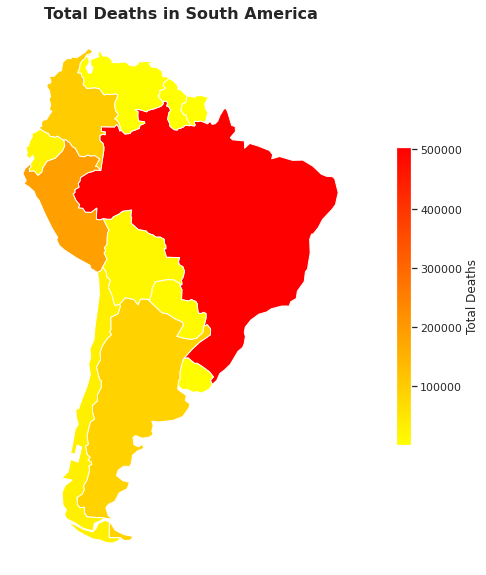

In [ ]:
map_south_america = south_america.plot(column='total_deaths',cmap='autumn_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Deaths",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Deaths in South America",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

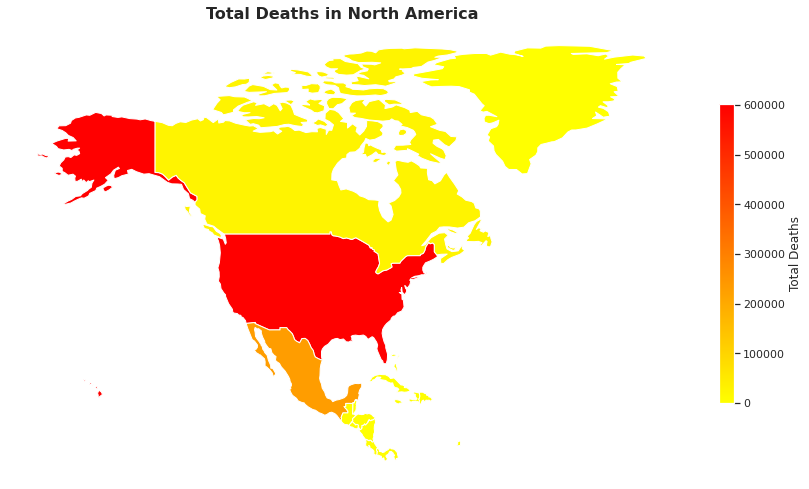

In [ ]:
map_north_america = north_america.plot(column='total_deaths',cmap='autumn_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Deaths",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Deaths in North America",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

Vaccinations


In [ ]:
#Create a Vaccination dataframe

june_people_vaccinated = june_df[['iso_code','country','total_vaccinations','total_vaccinations_per_hundred','people_vaccinated','people_vaccinated_per_hundred','people_fully_vaccinated','people_fully_vaccinated_per_hundred','geometry']]

june_people_vaccinated = june_people_vaccinated.sort_values(by='total_vaccinations_per_hundred',ascending=False)
june_people_vaccinated.head(10)

,iso_code,country,total_vaccinations,total_vaccinations_per_hundred,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,geometry
15908,CYM,Cayman Islands,89619.0,136.4,47419.0,72.2,41949.0,63.8,None
41391,ISR,Israel,10659364.0,123.2,5506696.0,63.6,5152668.0,59.5,"POLYGON ((35.71992 32.70919, 35.54567 32.39399..."
4096,ABW,Aruba,124332.0,116.5,67004.0,62.8,57328.0,53.7,None
34511,GGY,Guernsey,77881.0,116.2,0.0,0.0,0.0,0.0,None
6522,BHR,Bahrain,1968183.0,115.7,1046710.0,61.5,921473.0,54.1,None
40902,IMN,Isle of Man,97379.0,114.5,62418.0,73.4,34961.0,41.1,None
56338,MNG,Mongolia,3633222.0,110.8,1924675.0,58.7,1708547.0,52.1,"POLYGON ((87.75126 49.29720, 88.80557 49.47052..."
38306,ISL,Iceland,356839.0,104.6,240273.0,70.4,155323.0,45.5,"POLYGON ((-14.50870 66.45589, -14.73964 65.808..."
89397,URY,Uruguay,3617559.0,104.1,2166810.0,62.4,1450749.0,41.8,"POLYGON ((-57.62513 -30.21629, -56.97603 -30.1..."
68348,QAT,Qatar,2908963.0,101.0,1629077.0,56.5,1279866.0,44.4,"POLYGON ((50.81011 24.75474, 50.74391 25.48242..."


In [ ]:
flt_country = june_df.country == "Mongolia"
june_df[flt_country]

,iso_code,continent_x,country,date,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index,continent_y,name,geometry,date_sec
56338,MNG,Asia,Mongolia,2021-06-22,98050.0,0.0,459.0,0.0,29908.9,0.0,140.0,0.0,0.0,0.0,0.0,3633222.0,1924675.0,1708547.0,0.0,110.8,58.7,52.1,0.0,3278292.0,2.0,28.6,11840.8,0.5,7.0,0.7,Asia,Mongolia,"POLYGON ((87.75126 49.29720, 88.80557 49.47052...",1624320000


In [ ]:
june_people_vaccinated = gpd.GeoDataFrame(june_people_vaccinated, geometry='geometry')

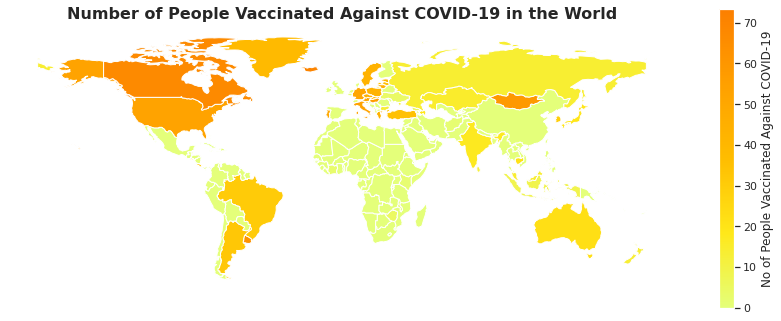

In [ ]:
#Generate the choropleth map using gdf plot function on people Vaccinated per hundred

columnfig = june_people_vaccinated.plot(column='people_vaccinated_per_hundred',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of People Vaccinated Against COVID-19",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Number of People Vaccinated Against COVID-19 in the World",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

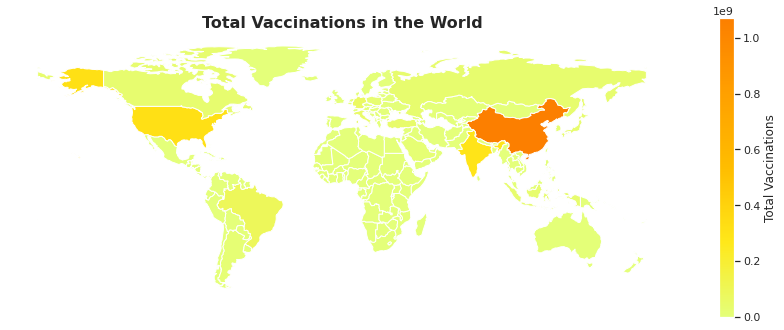

In [ ]:
#Generate the choropleth map using gdf plot function on the Total Vaccinations

columnfig = june_people_vaccinated.plot(column='total_vaccinations',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Vaccinations",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Vaccinations in the World",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

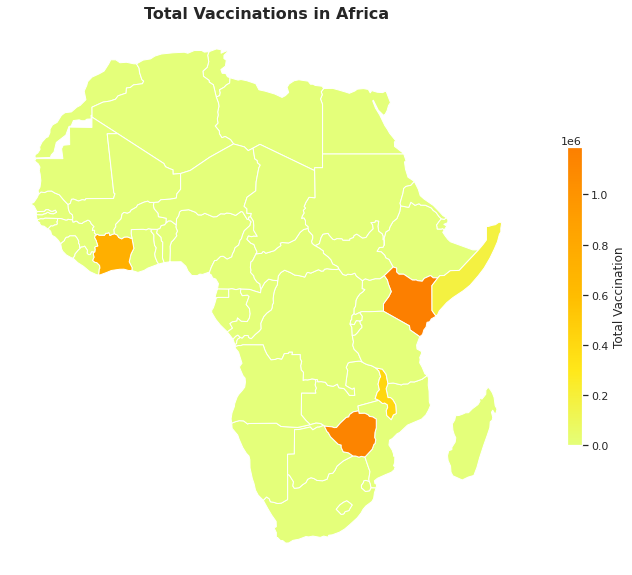

In [ ]:
map_africa = africa.plot(column='total_vaccinations',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Vaccination",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Vaccinations in Africa",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

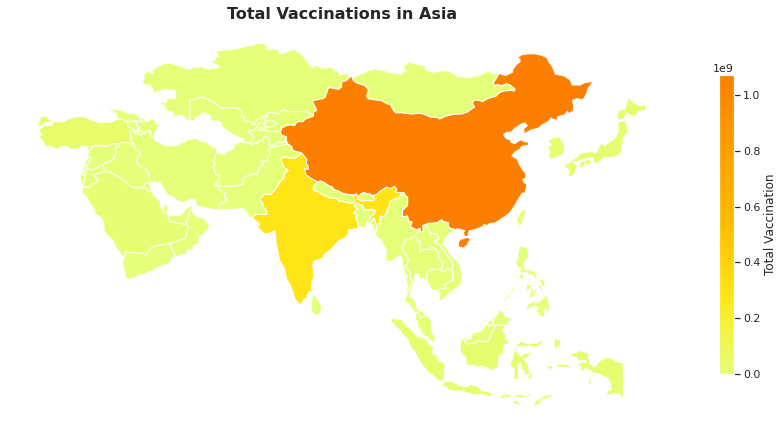

In [ ]:
map_asia = asia.plot(column='total_vaccinations',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Vaccination",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Vaccinations in Asia",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

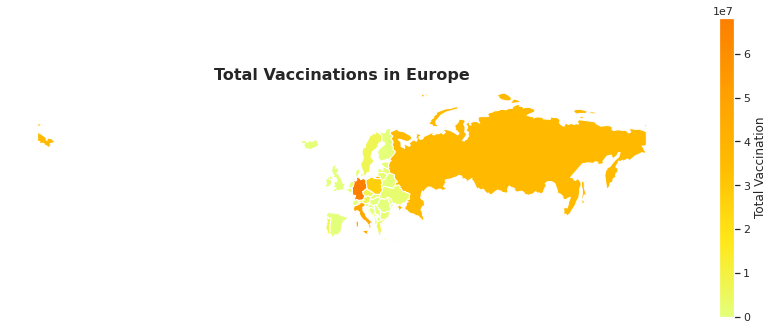

In [ ]:
map_europe = europe.plot(column='total_vaccinations',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Vaccination",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Vaccinations in Europe",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

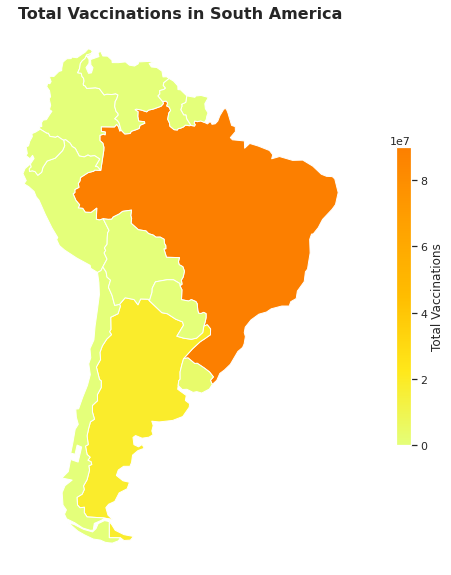

In [ ]:
map_south_america = south_america.plot(column='total_vaccinations',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Vaccinations",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Vaccinations in South America",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

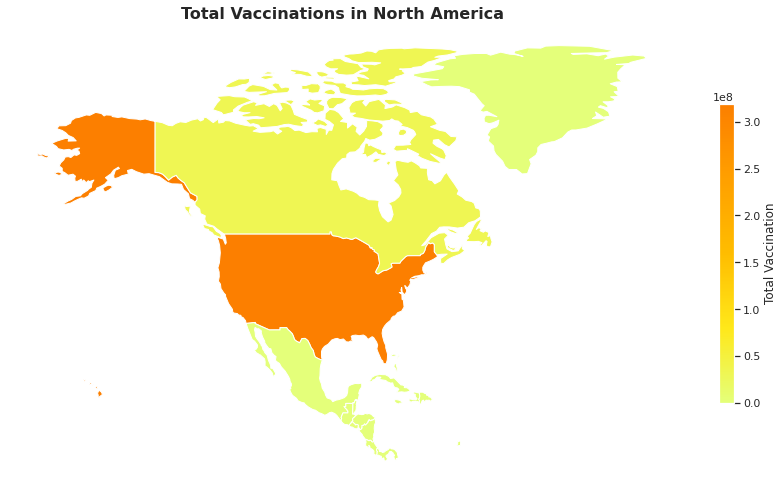

In [ ]:
map_north_america = north_america.plot(column='total_vaccinations',cmap='Wistia',figsize=(15,10), legend = True,
                                legend_kwds={'label': "Total Vaccination",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Total Vaccinations in North America",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

Comparison for people fully vaccinated

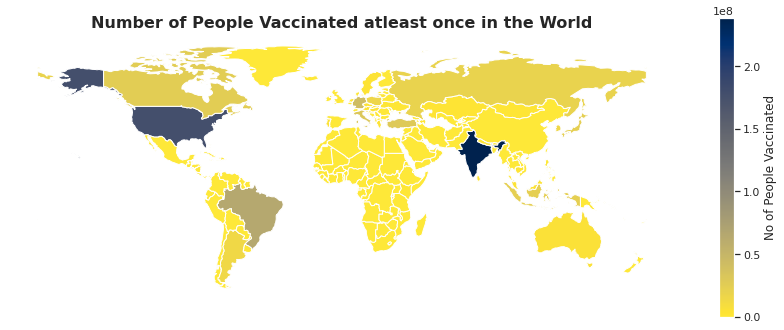

In [ ]:
columnfig = june_people_vaccinated.plot(column='people_vaccinated',cmap='cividis_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of People Vaccinated",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Number of People Vaccinated atleast once in the World",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

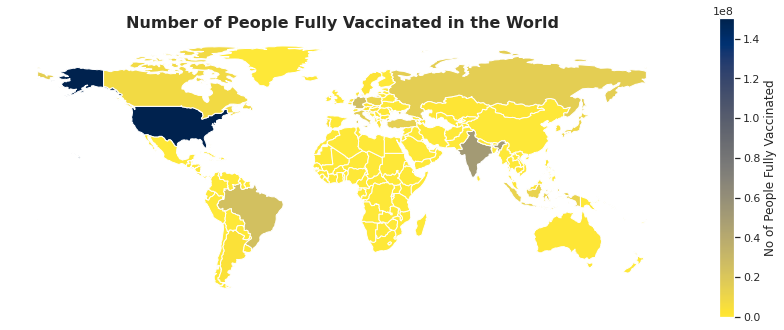

In [ ]:
columnfig = june_people_vaccinated.plot(column='people_fully_vaccinated',cmap='cividis_r',figsize=(15,10), legend = True,
                                legend_kwds={'label': "No of People Fully Vaccinated",'orientation': "vertical", 'shrink': 0.55})

#removing axis ticks
plt.axis('off')

#Add the title
plt.title("Number of People Fully Vaccinated in the World",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
plt.show()

Exprolatory Data 

Group by Dates

In [ ]:
#convert column datatype to date
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')


In [ ]:
# Group values in the dataframe by date
grouped_dates = df.groupby('date')
grouped_dates

In [ ]:
# Create a dataframe with the maximun values for each date
grouped_dates_max = grouped_dates.max()
# Create a dataframe with the sum of values for each date
grouped_dates_sum = grouped_dates.sum()

Text(0, 0.5, 'Population')

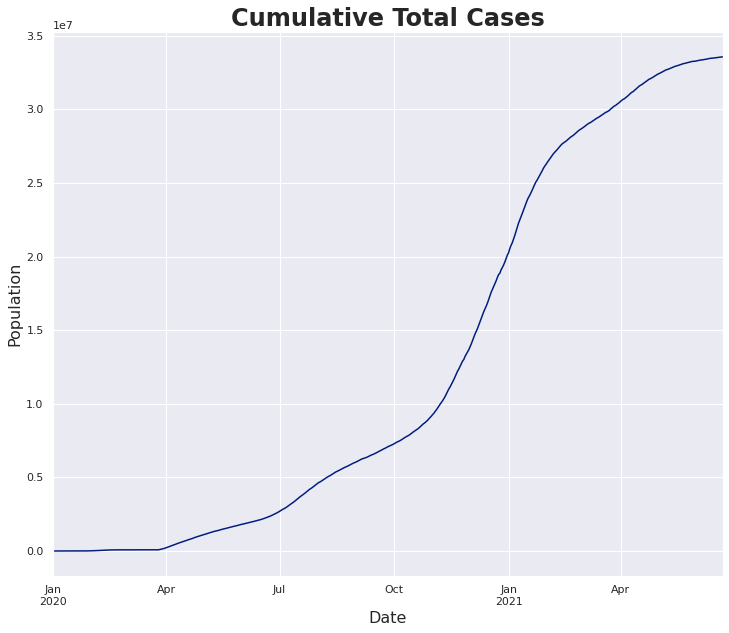

In [ ]:
# Plot the total cases column
ax_dt=grouped_dates_max['total_cases'].plot(kind='line',figsize=(12,10))

ax_dt.set_title("Cumulative Total Cases",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Population',fontsize = 16)


Text(0, 0.5, 'Number')

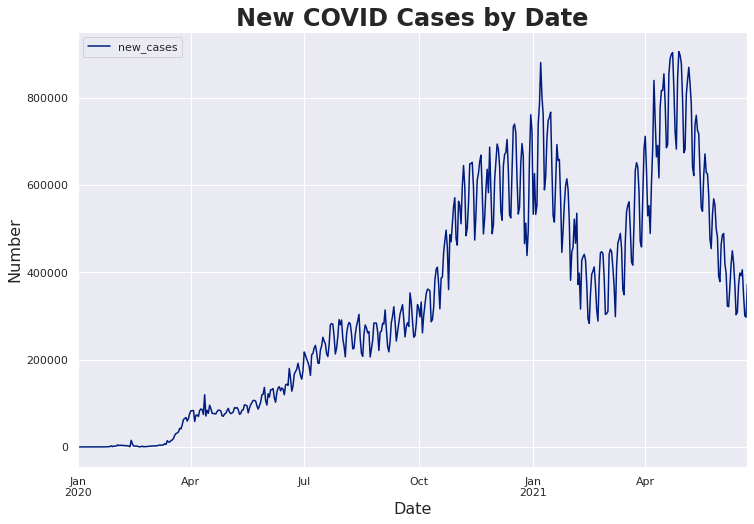

In [ ]:
ax_dt=grouped_dates_sum[['new_cases']].plot(kind='line',figsize=(12,8))
ax_dt.set_title("New COVID Cases by Date",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)


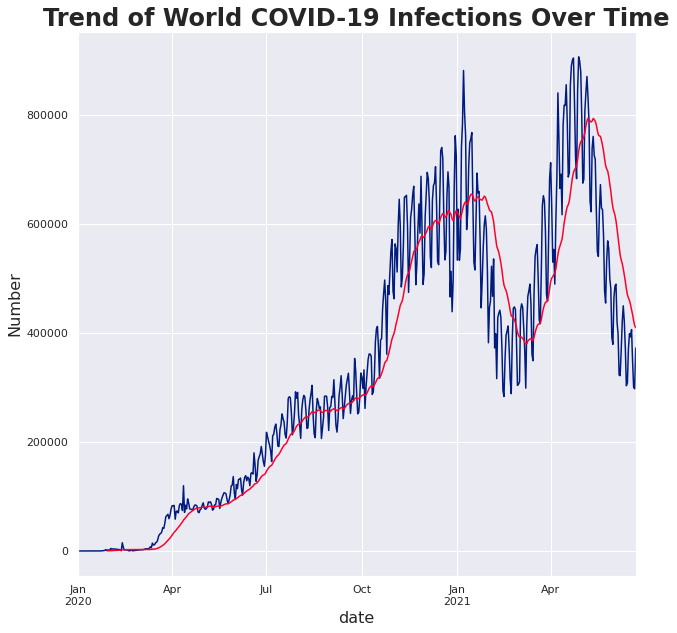

In [ ]:

ax_dt=grouped_dates_sum['new_cases'].plot(kind='line',figsize=(10,10),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)

ax_dt.set_title("Trend of World COVID-19 Infections Over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_sum.index, rotation=45 );
grouped_dates_sum['new_cases'].rolling(window=30).mean().plot(cmap='gist_rainbow')

Text(0, 0.5, 'Number')

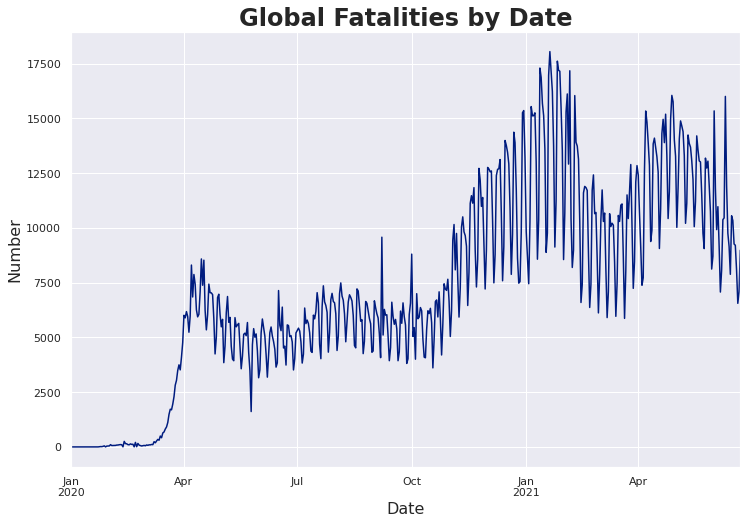

In [ ]:
ax_dt=grouped_dates_sum['new_deaths'].plot(kind='line',figsize=(12,8),logy=False)

ax_dt.set_title("Global Fatalities by Date",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)

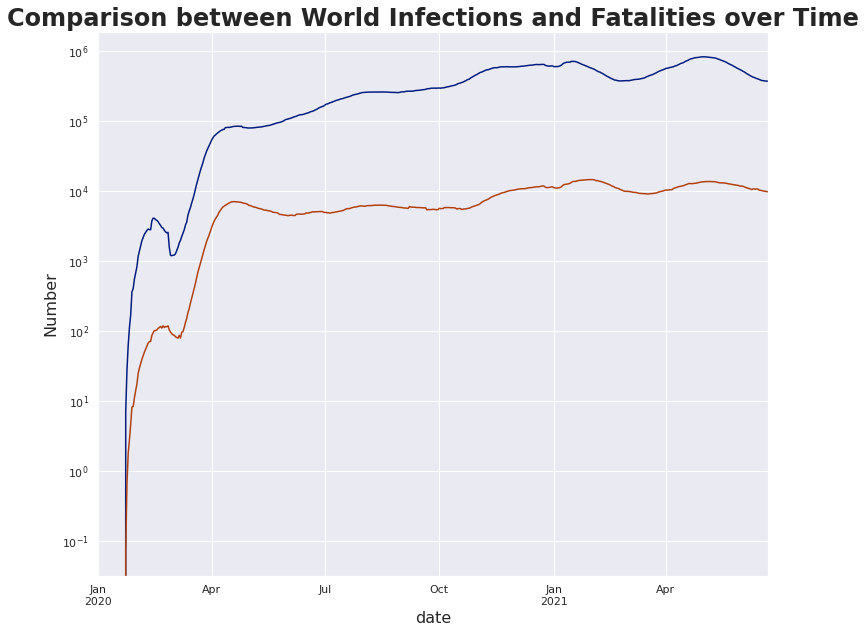

In [ ]:
ax_d=grouped_dates_sum['new_cases'].rolling(window=14).mean().plot(figsize=(12,10),logy=True)
ax_d.set_title("Comparison between World Infections and Fatalities over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_d.set_xlabel('Date',fontsize = 16, )
ax_d.set_ylabel('Number',fontsize = 16)
ax_d.set_xticklabels(grouped_dates_sum.index, rotation=45 );
grouped_dates_sum['new_deaths'].rolling(window=14).mean().plot(logy=True)

Text(0, 0.5, 'Daily Fatalities')

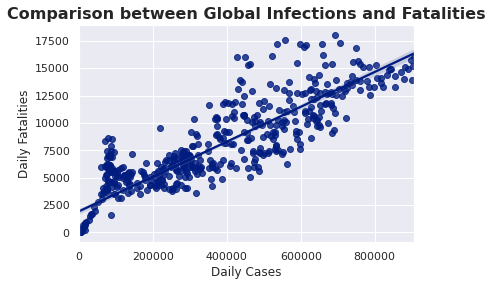

In [ ]:
ax_c=sns.regplot(x='new_cases', y='new_deaths', data= grouped_dates_sum)
ax_c.set_title("Comparison between Global Infections and Fatalities",fontdict= { 'fontsize': 16, 'fontweight':'bold'})
ax_c.set_xlabel('Daily Cases',fontsize = 12 )
ax_c.set_ylabel('Daily Fatalities',fontsize = 12)

In [ ]:
x=grouped_dates_sum['new_cases']
y=grouped_dates_sum['new_deaths']
x.corr(y)

0.8865271886262943

Group by country

In [ ]:
country_group = df.groupby('country')
usa_df = country_group.get_group("United States")
usa_df.set_index('date', inplace=True)
ke_df = country_group.get_group("Kenya")
ke_df.set_index('date', inplace=True)
sweden_df = country_group.get_group("Sweden")
sweden_df.set_index('date', inplace=True)
nz_df = country_group.get_group("New Zealand")
nz_df.set_index('date', inplace=True)
uk_df = country_group.get_group("United Kingdom")
uk_df.set_index('date', inplace=True)
ind_df = country_group.get_group("India")
ind_df.set_index('date', inplace=True)
sa_df = country_group.get_group("South Africa")
sa_df.set_index('date', inplace=True)

In [ ]:
country_df= country_group.sum().sort_values(by='new_cases',ascending=False)
country_df = country_df.rename(columns={'new_cases':'cases'})
country_df = country_df.rename(columns={'new_deaths':'deaths'})
country_df = country_df.rename(columns={'new_vaccinations':'vaccinations'})
country_df.head(2)

,total_cases,cases,total_deaths,deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index
country,,,,,,,,,,,,,,,,,,,,,,,,,,
United States,6850378129.0,33565214.0,137979193.0,602462.0,20695840.9,101404.7,416852.2,1820.1,18217926.0,55038.6,2375747.0,26140931352.0,15876916974.0,10796736035.0,305179596.0,7816.3,4747.3,3228.2,30589.2,171459371146.0,18444.9,19839.4,28088781.0,621.6,1434.9,479.7
India,3928081181.0,30028709.0,53140238.0,390660.0,2846426.6,21759.9,38507.3,283.1,0.0,0.0,0.0,15321859714.0,12525550336.0,2796309378.0,277487970.0,1110.3,907.6,202.6,35918.7,703802236350.0,229713.7,14382.0,3277603.7,10812.0,270.3,328.9


Text(0, 0.5, 'Number')

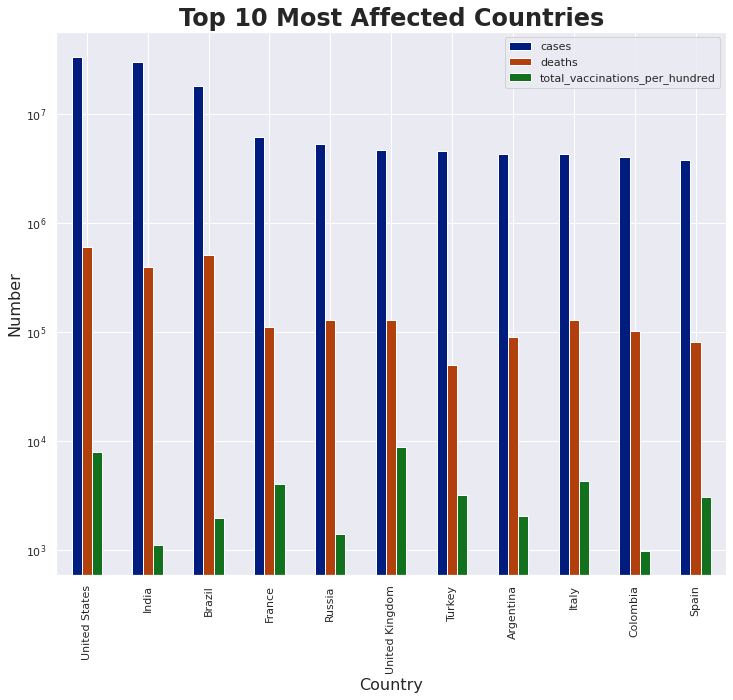

In [ ]:
ax_ct=country_df.iloc[:11][['cases','deaths','total_vaccinations_per_hundred']].plot(kind='bar',figsize=(12,10),logy=True)

ax_ct.set_title("Top 10 Most Affected Countries",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_ct.set_xlabel('Country',fontsize = 16, )
ax_ct.set_ylabel('Number',fontsize = 16)

Text(0, 0.5, 'Number')

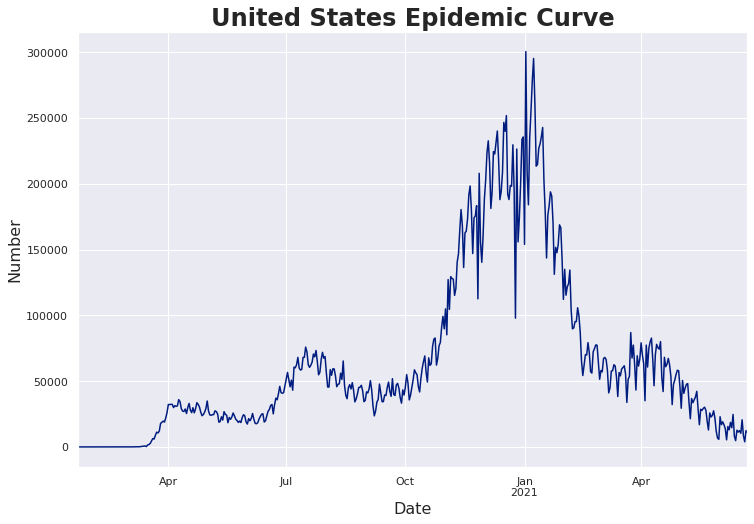

In [ ]:
ax_dt=usa_df['new_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("United States Epidemic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
#usa_df['new_cases'].rolling(window=14).mean().plot()

Text(0, 0.5, 'Population')

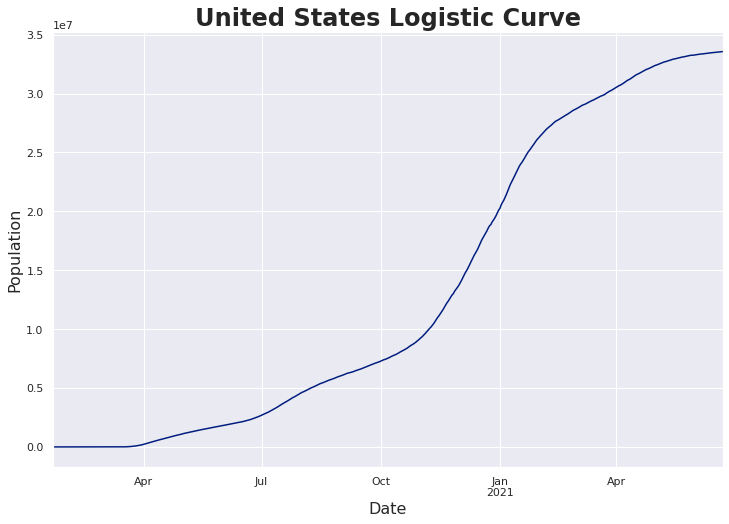

In [ ]:
ax_dt=usa_df['total_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("United States Logistic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Population',fontsize = 16, )

Text(0, 0.5, 'Number')

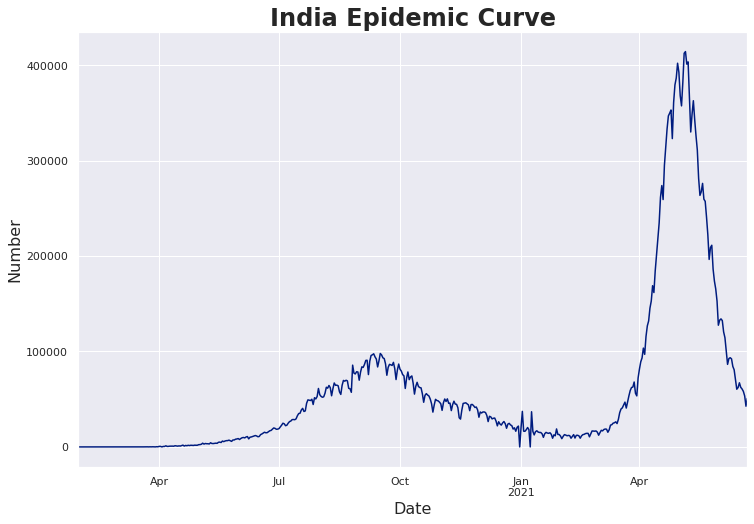

In [ ]:
ax_dt=ind_df['new_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("India Epidemic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
#ind_df['new_cases'].rolling(window=14).mean().plot()

Text(0, 0.5, 'Population')

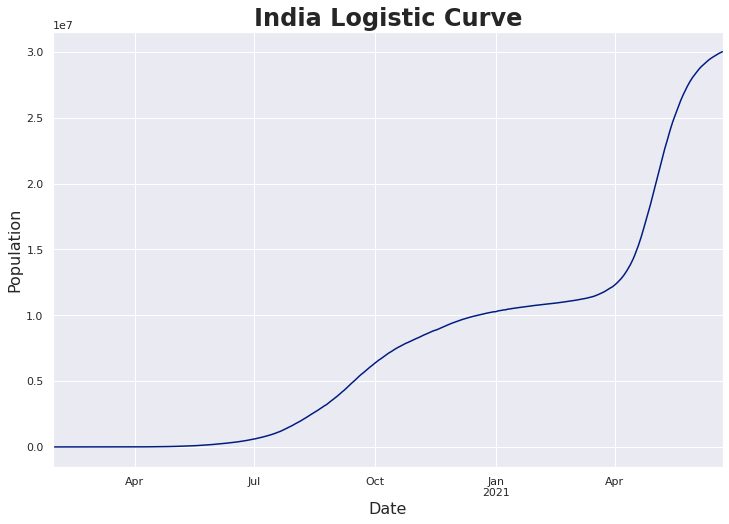

In [ ]:
ax_dt=ind_df['total_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("India Logistic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Population',fontsize = 16, )

Text(0, 0.5, 'Number')

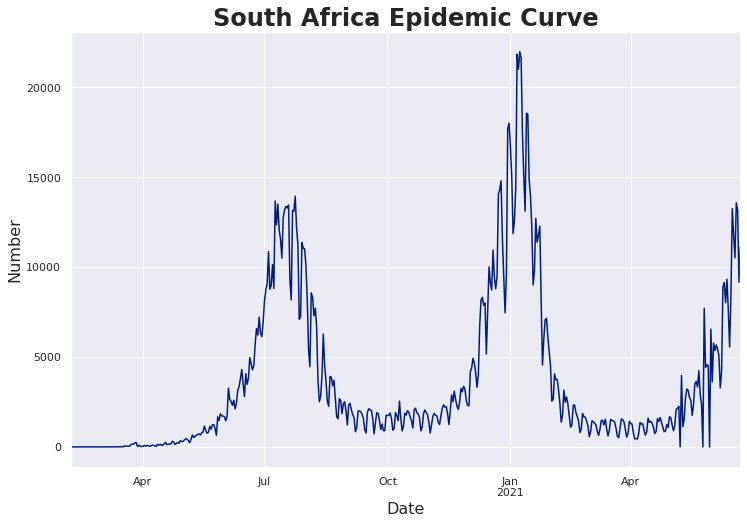

In [ ]:
ax_dt=sa_df['new_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("South Africa Epidemic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
#ke_df['new_cases'].rolling(window=14).mean().plot()

Text(0, 0.5, 'Population')

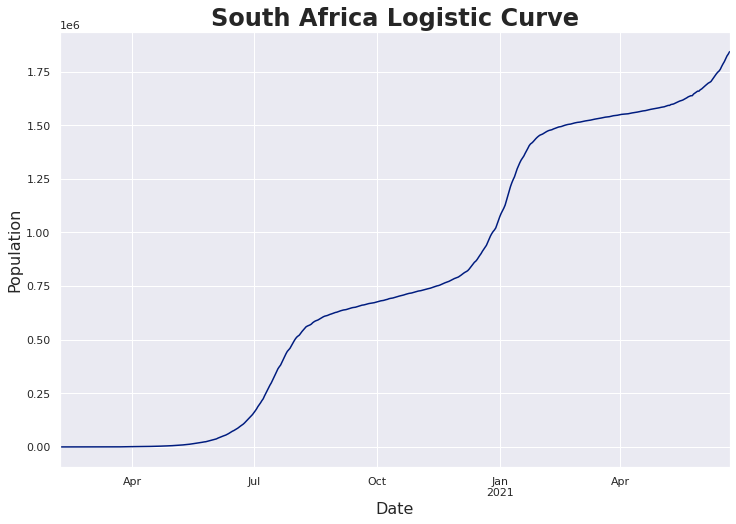

In [ ]:
ax_dt=sa_df['total_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("South Africa Logistic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Population',fontsize = 16, )

Text(0, 0.5, 'Number')

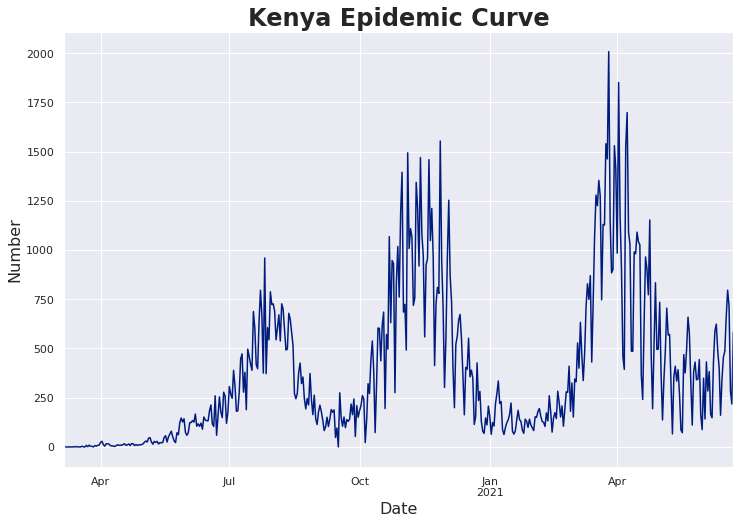

In [ ]:
ax_dt=ke_df['new_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("Kenya Epidemic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
#ke_df['new_cases'].rolling(window=14).mean().plot()

Text(0, 0.5, 'Population')

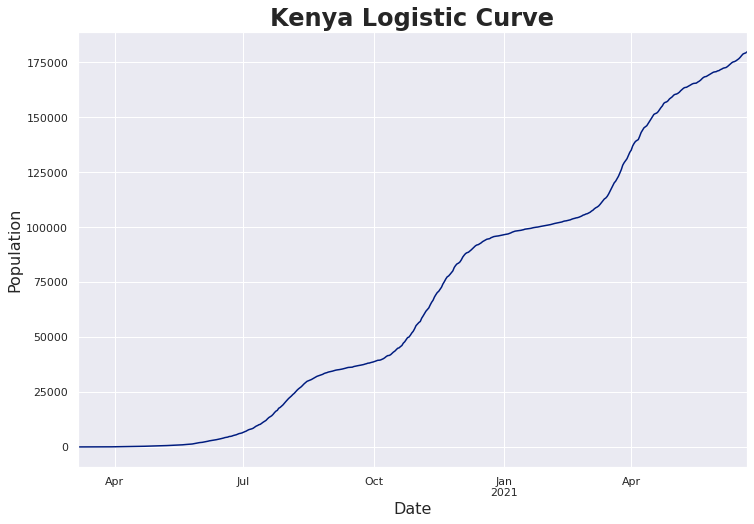

In [ ]:
ax_dt=ke_df['total_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("Kenya Logistic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Population',fontsize = 16, )

Compare a country that locked down vs one that did not.

Text(0, 0.5, 'Number')

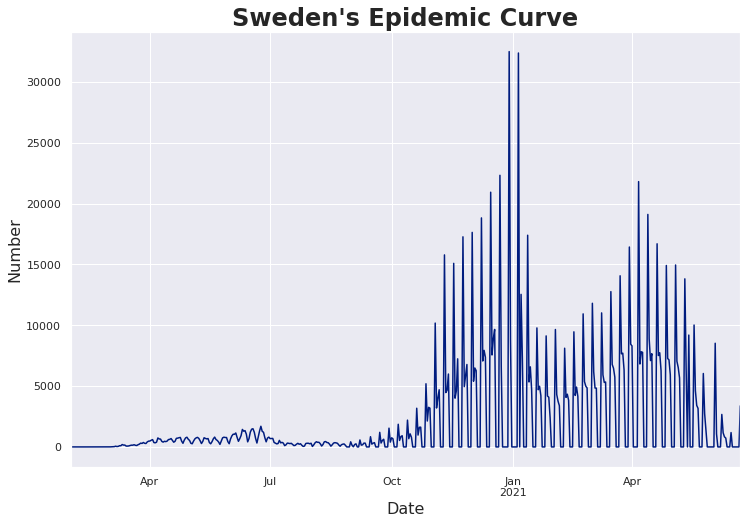

In [ ]:
ax_dt=sweden_df['new_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("Sweden's Epidemic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
#sweden_df['new_cases'].rolling(window=14).mean().plot()

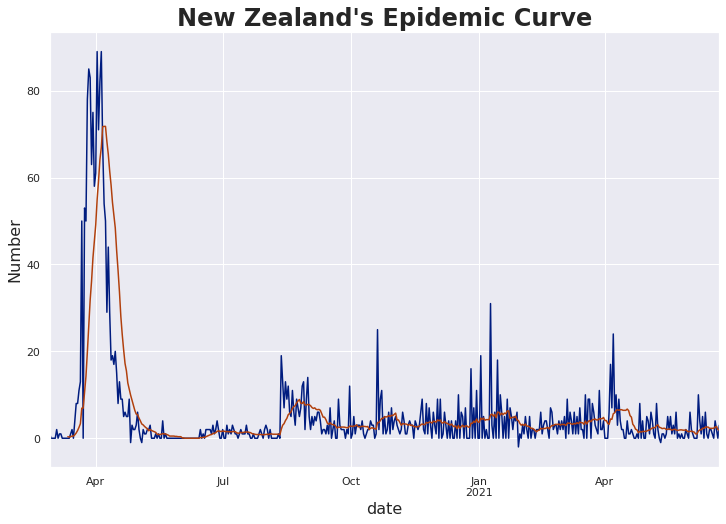

In [ ]:
ax_dt=nz_df['new_cases'].plot(kind='line',figsize=(12,8),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("New Zealand's Epidemic Curve",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
nz_df['new_cases'].rolling(window=14).mean().plot()

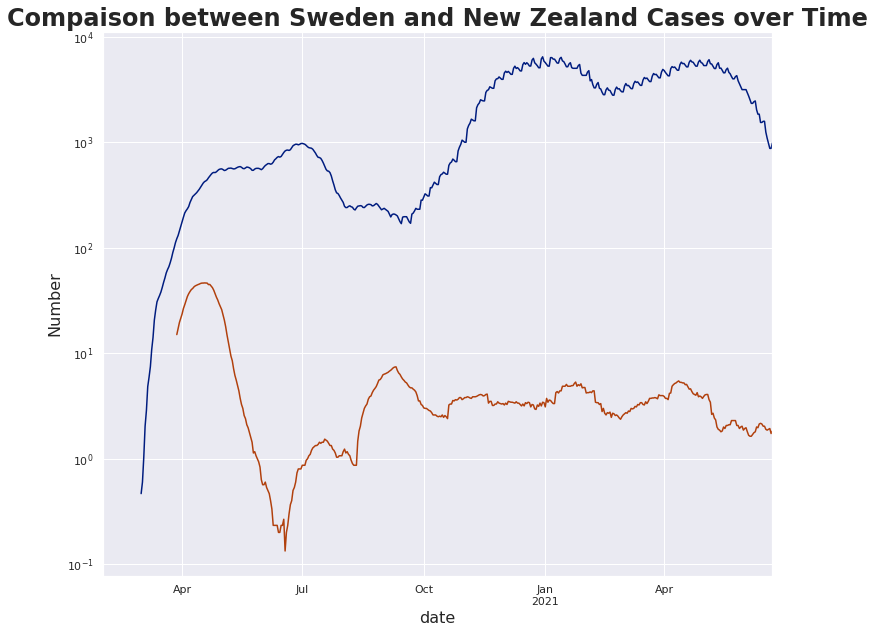

In [ ]:
ax_d=sweden_df['new_cases'].rolling(window=30).mean().plot(figsize=(12,10),logy=True)
ax_d.set_title("Compaison between Sweden and New Zealand Cases over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_d.set_xlabel('Date',fontsize = 16, )
ax_d.set_ylabel('Number',fontsize = 16)
ax_d.set_xticklabels(grouped_dates_sum.index, rotation=45 );
nz_df['new_cases'].rolling(window=30).mean().plot(logy=True)

Vaccinations

In [ ]:
# Get data from 1st of January, 2021 
vax_df =grouped_dates_sum.loc['2021-01-01':]

vax_df.head()



,total_cases,new_cases,total_deaths,new_deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,new_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2021-01-01,84093067.0,533306.0,1890263.0,9829.0,3073364.6,22650.3,57010.1,333.7,258967.0,9122.3,0.0,1645026.0,1643958.0,1087.0,119372.0,18.8,18.8,0.0,9850.0,7756279972.0,63874.5,5473.5,3422875.6,1715.6,498.2,133.0
2021-01-02,84719578.0,626511.0,1898849.0,8586.0,3090031.0,16666.4,57314.2,304.0,262363.0,9277.9,0.0,6899635.0,6898282.0,1385.0,175970.0,22.1,22.1,0.0,9856.9,7756279972.0,63874.5,5473.5,3422875.6,1715.6,498.2,133.0
2021-01-03,85252481.0,532903.0,1906301.0,7452.0,3108039.0,18008.1,57636.6,322.4,268804.0,9561.2,194327.8,3529154.0,3505792.0,23362.0,223208.0,24.9,24.8,0.0,9881.5,7756279972.0,63874.5,5473.5,3422875.6,1715.6,498.2,133.0
2021-01-04,85806322.0,553841.0,1916565.0,10264.0,3131911.2,23872.1,58224.6,588.0,288627.0,10098.8,0.0,7201428.0,7152810.0,1449.0,364113.0,26.8,26.5,0.0,9891.6,7756279972.0,63874.5,5473.5,3422875.6,1715.6,498.2,133.0
2021-01-05,86546375.0,740053.0,1932105.0,15540.0,3163768.1,31857.0,58832.2,607.6,290467.0,10002.1,0.0,8738117.0,7904926.0,1496.0,734741.0,38.6,30.1,0.0,9841.6,7756279972.0,63874.5,5473.5,3422875.6,1715.6,498.2,133.0


Text(0, 0.5, 'Number')

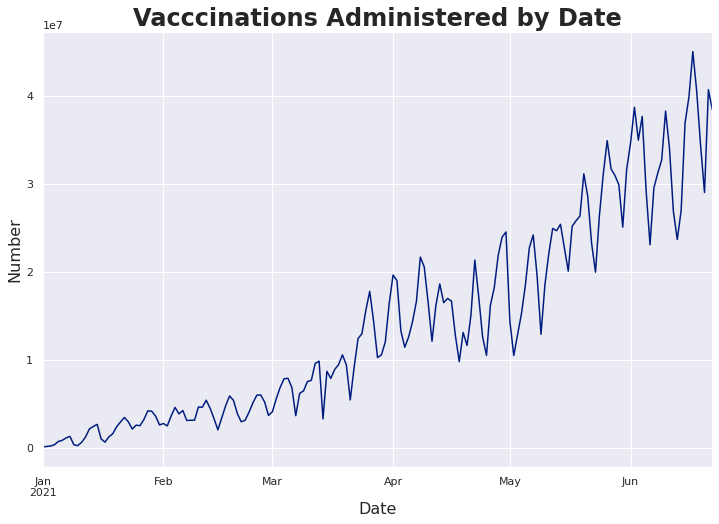

In [ ]:
ax_vx=vax_df['new_vaccinations'].plot(kind='line',figsize=(12,8))

ax_vx.set_title("Vacccinations Administered by Date",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_vx.set_xlabel('Date',fontsize = 16, )
ax_vx.set_ylabel('Number',fontsize = 16)

Text(0, 0.5, 'Number')

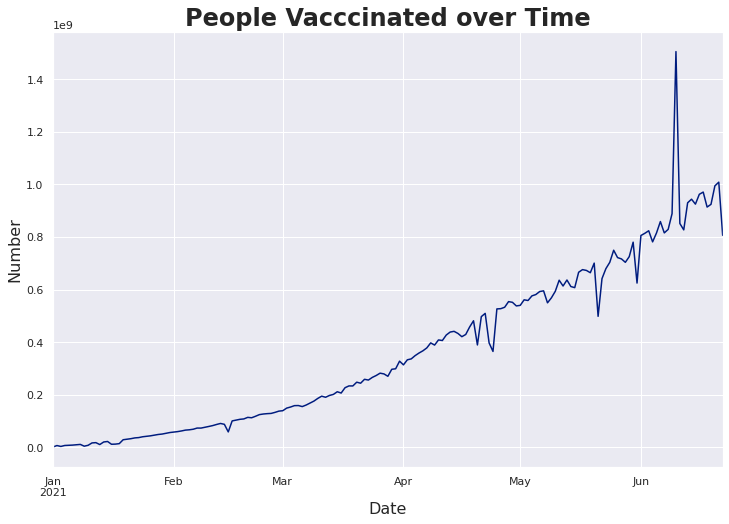

In [ ]:
ax_vx=vax_df['people_vaccinated'].plot(kind='line',figsize=(12,8))

ax_vx.set_title("People Vacccinated over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_vx.set_xlabel('Date',fontsize = 16, )
ax_vx.set_ylabel('Number',fontsize = 16)

In [ ]:
country_vax_df= country_group.sum().sort_values(by='total_vaccinations_per_hundred',ascending=False)
#country_vax_df= country_group.sum().sort_values(by='total_vaccinations',ascending=False)
country_vax_df = country_vax_df.rename(columns={'new_cases':'cases'})
country_vax_df = country_vax_df.rename(columns={'new_deaths':'deaths'})
country_vax_df = country_vax_df.rename(columns={'new_vaccinations':'vaccinations_administered'})
country_vax_df.head(5)

,total_cases,cases,total_deaths,deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,vaccinations_administered,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index
country,,,,,,,,,,,,,,,,,,,,,,,,,,
Israel,173412975.0,840079.0,1328573.0,6428.0,20034908.8,97056.8,153493.9,742.7,380456.0,43955.2,44370.0,1433880327.0,789940900.0,643939427.0,10659304.0,16566.1,9126.3,7439.6,31298.5,4232559549.0,196874.3,14963.4,16201704.5,244.5,1462.1,449.4
Gibraltar,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4497326.0,2618107.0,1878686.0,66867.0,13348.8,7771.0,5576.2,0.0,5491633.0,563507.3,0.0,0.0,0.0,0.0,0.0
United Arab Emirates,97958469.0,616160.0,329555.0,1767.0,9904399.1,62298.8,33320.7,178.6,0.0,0.0,0.0,1245323614.0,9398836.0,6274370.0,12773875.0,12591.2,95.0,63.4,28100.3,5053994400.0,57457.9,17374.0,34386969.8,0.0,613.2,454.8
Malta,5289947.0,30595.0,72604.0,420.0,11980701.6,69291.7,164433.9,951.2,0.0,0.0,1349.8,39446941.0,25566125.0,14239642.0,617499.0,8934.0,5790.2,3225.0,27061.2,222094117.0,731380.6,21327.2,18366201.5,100.6,2256.0,450.2
United Kingdom,892836275.0,4668043.0,32004270.0,128272.0,13151993.4,68763.0,471441.4,1889.5,4537501.0,66840.0,465438.0,5953773342.0,4335102578.0,1618670764.0,71960112.0,8770.3,6385.8,2384.4,33183.4,34553976036.0,138905.1,20767.2,20234401.2,101.8,1292.9,474.4


In [ ]:
country_vax2_df= country_group.sum().sort_values(by='new_vaccinations',ascending=False)
country_vax2_df = country_vax2_df.rename(columns={'new_cases':'cases'})
country_vax2_df = country_vax2_df.rename(columns={'new_deaths':'deaths'})
country_vax2_df = country_vax2_df.rename(columns={'new_vaccinations':'vaccinations_administered'})
country_vax2_df.head(2)

,total_cases,cases,total_deaths,deaths,total_cases_per_million,new_cases_per_million,total_deaths_per_million,new_deaths_per_million,hosp_patients,hosp_patients_per_million,weekly_hosp_admissions,total_vaccinations,people_vaccinated,people_fully_vaccinated,vaccinations_administered,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,hospital_beds_per_thousand,human_development_index
country,,,,,,,,,,,,,,,,,,,,,,,,,,
China,43037460.0,91158.0,2201129.0,4619.0,29901.2,63.3,1529.4,3.2,0.0,0.0,0.0,39379733700.0,622000000.0,223299000.0,991323000.0,2736.0,43.2,15.5,37242.1,745569714932.0,76495.1,20046.6,7929912.8,362.6,2248.1,394.2
United States,6850378129.0,33565214.0,137979193.0,602462.0,20695840.9,101404.7,416852.2,1820.1,18217926.0,55038.6,2375747.0,26140931352.0,15876916974.0,10796736035.0,305179596.0,7816.3,4747.3,3228.2,30589.2,171459371146.0,18444.9,19839.4,28088781.0,621.6,1434.9,479.7


Text(0, 0.5, 'Population (natural log)')

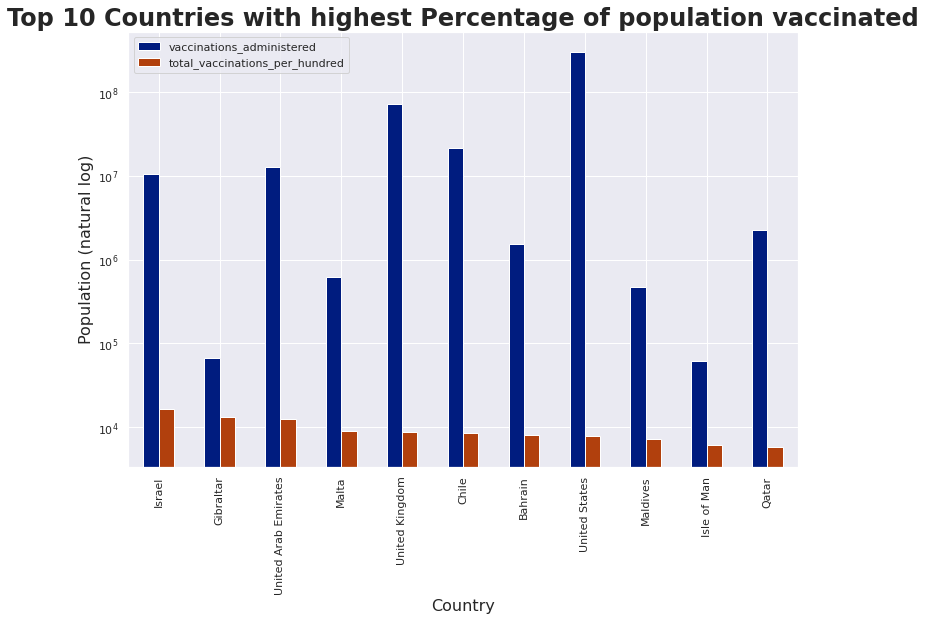

In [ ]:
ax_ct=country_vax_df.iloc[:11][['vaccinations_administered','total_vaccinations_per_hundred']].plot(kind='bar',figsize=(12,8),logy=True)

ax_ct.set_title("Top 10 Countries with highest Percentage of population vaccinated",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_ct.set_xlabel('Country',fontsize = 16, )
ax_ct.set_ylabel('Population (natural log)',fontsize = 16)
#ax_cont.set_xticklabels(vax_df.index, rotation=45 );

Comparison between people who got one vaccination and fully vaccinated in countries with most vaccinated per hundred.

Text(0, 0.5, 'Population (natural log)')

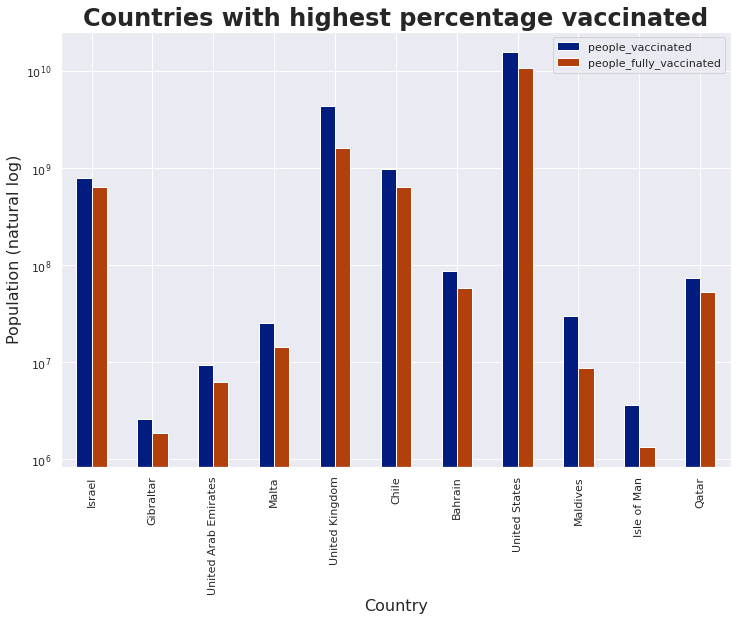

In [ ]:
ax_ct=country_vax_df.iloc[:11][['people_vaccinated','people_fully_vaccinated']].plot(kind='bar',figsize=(12,8),logy=True)

ax_ct.set_title("Countries with highest percentage vaccinated",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_ct.set_xlabel('Country',fontsize = 16, )
ax_ct.set_ylabel('Population (natural log)',fontsize = 16)
#ax_cont.set_xticklabels(vax_df.index, rotation=45 );

Comparison between people who got one vaccination and fully vaccinated in countries with most vaccinations administered.

Text(0, 0.5, 'Population (natural log)')

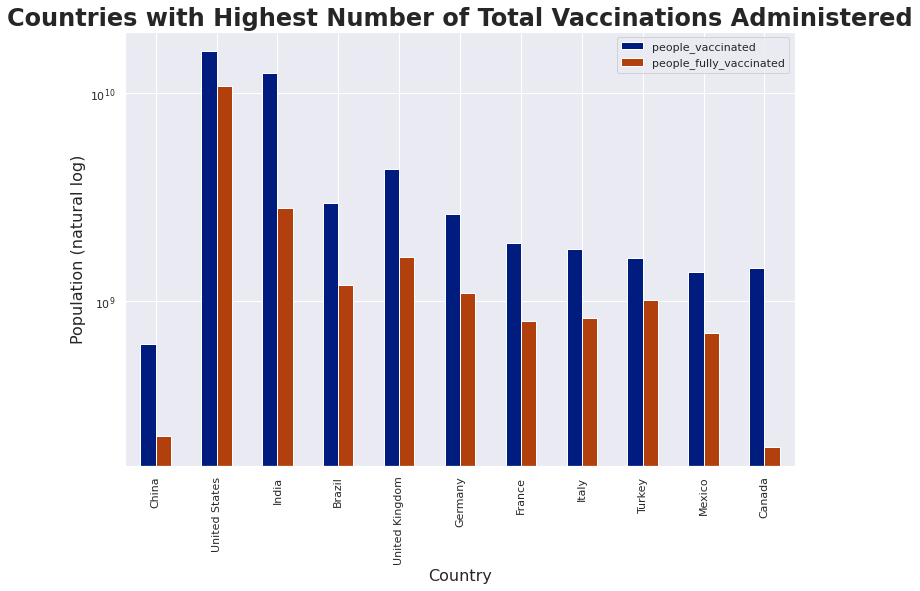

In [ ]:
ax_ct=country_vax2_df.iloc[:11][['people_vaccinated','people_fully_vaccinated']].plot(kind='bar',figsize=(12,8),logy=True)

ax_ct.set_title("Countries with Highest Number of Total Vaccinations Administered",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_ct.set_xlabel('Country',fontsize = 16, )
ax_ct.set_ylabel('Population (natural log)',fontsize = 16)
#ax_cont.set_xticklabels(vax_df.index, rotation=45 );

Text(0, 0.5, 'Number')

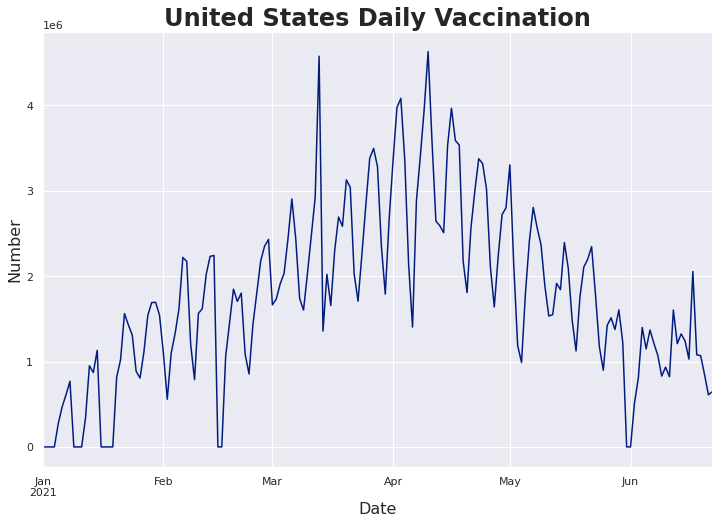

In [ ]:
ax_dt=usa_df.loc['2021-01-01':]['new_vaccinations'].plot(kind='line',figsize=(12,8),logy=False)

ax_dt.set_title("United States Daily Vaccination",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)

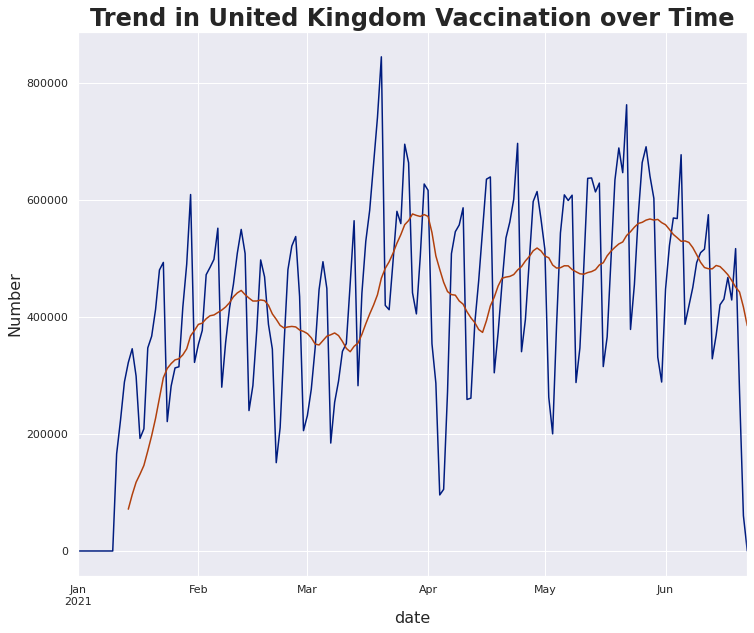

In [ ]:
ax_dt=uk_df.loc['2021-01-01':]['new_vaccinations'].plot(kind='line',figsize=(12,10),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("Trend in United Kingdom Vaccination over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
uk_df.loc['2021-01-01':]['new_vaccinations'].rolling(window=14).mean().plot()

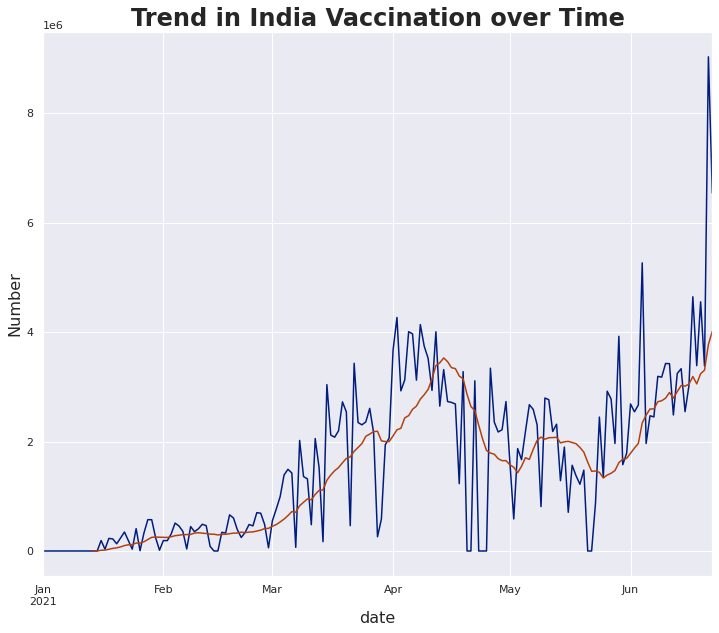

In [ ]:
ax_dt=ind_df.loc['2021-01-01':]['new_vaccinations'].plot(kind='line',figsize=(12,10),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("Trend in India Vaccination over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );
ind_df.loc['2021-01-01':]['new_vaccinations'].rolling(window=14).mean().plot()

Text(0, 0.5, 'Number')

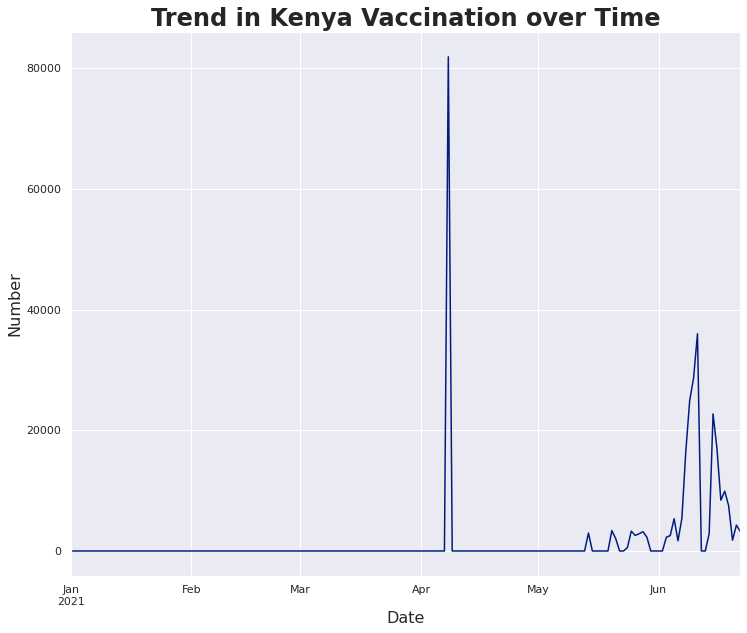

In [ ]:
ax_dt=ke_df.loc['2021-01-01':]['new_vaccinations'].plot(kind='line',figsize=(12,10),logy=False)
#ax_dt = sns.lineplot(x=grouped_dates_df.index, y="new_cases", hue='total_cases', data=grouped_dates_df)
#ax_dt=grouped_dates_df.plot(x= grouped_dates_df, y =['total_cases','new_cases'],kind='line',figsize=(15,10),logy=False)
ax_dt.set_title("Trend in Kenya Vaccination over Time",fontdict= { 'fontsize': 24, 'fontweight':'bold'})
ax_dt.set_xlabel('Date',fontsize = 16, )
ax_dt.set_ylabel('Number',fontsize = 16)
#ax_cont.set_xticklabels(grouped_dates_df.index, rotation=45 );

## Prediction of daily Vaccination in United states.
Our aim is to forecast the number of new vaccinations to be administered in the next * n* number of days. This will help in reource allocation for manufacturing companies,suppliers, health personel, government.

We are dealing with time series data.       
 Time series data is a collection of quantities that are assembled over even intervals in time and ordered chronologically.     
 Our data is collected daily over a period of six months.

#### Using Statistical Models.



In [ ]:
# Time series data of daily vaccinations administered.
usa_vax = usa_df.loc['2021-01-05':][['new_vaccinations']]
# Create a dataframe
usa_vax= pd.DataFrame(usa_vax)
usa_vax = usa_vax.rename(columns={'new_vaccinations':'vaccinations_administered'})

usa_vax.head()

,vaccinations_administered
date,
2021-01-05,273209.0
2021-01-06,470328.0
2021-01-07,612621.0
2021-01-08,768813.0
2021-01-09,0.0


In [ ]:
usa_vax.describe()

,vaccinations_administered
count,205.0
mean,1603167.2
std,1020571.8
min,0.0
25%,808036.0
50%,1512303.0
75%,2231745.0
max,4629928.0


Distribution of Vaccinations administered.

Text(0.5, 1.0, 'Distribution of vaccinations administered per day')

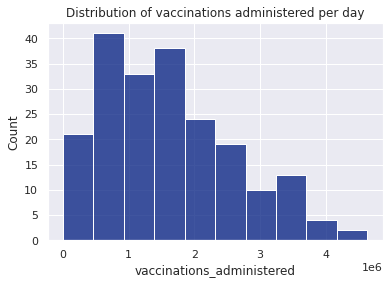

In [ ]:

vplt=sns.histplot(usa_vax['vaccinations_administered'])
vplt.set_title("Distribution of vaccinations administered per day")

In [ ]:
# Function to plot for stationarity test
def stationary_test_plot(series):
  ax=series.plot()
  ax.set_title("Stationarity Visualisayion",fontdict= { 'fontsize': 14, 'fontweight':'bold'})
  ax.set_xlabel('Date',fontsize = 12, )
  ax.set_ylabel('Number',fontsize = 12)
  #Plotting the moving average
  series.rolling(window=7).mean().plot()
  #Plotting the moving standard deviation.
  series.rolling(window=7).std().plot()
  

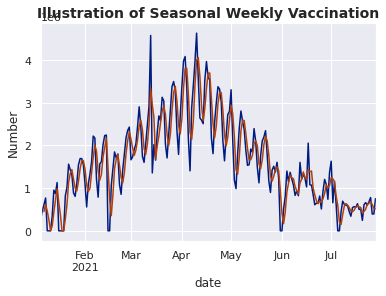

In [ ]:
# Plotting new vaccinations over time
ax=usa_vax.loc[:'2021-07-28']['vaccinations_administered'].plot()
ax.set_title("Illustration of Seasonal Weekly Vaccination",fontdict= { 'fontsize': 14, 'fontweight':'bold'})
ax.set_xlabel('Date',fontsize = 12, )
ax.set_ylabel('Number',fontsize = 12)
#Plotting the moving average
usa_vax['vaccinations_administered'].rolling(window=3).mean().plot()
#Plotting the moving standard deviation.
#usa_vax['vaccinations_administered'].rolling(window=3).std().plot()

- There's an upward trend between January and May with peaks in mid-March and mid-April followed by a downward trend from May to June.
- The mean is not constant.
- The variance is not constant.
- The series is not stationary.

In [ ]:
m1=round(usa_vax['vaccinations_administered'][:80].mean())
m2=round(usa_vax['vaccinations_administered'][81:].mean())
print("First mean is: ",m1, "and the Second mean is: ",m2)

First mean is:  1508482 and the Second mean is:  1649930


In [ ]:
v1=round(usa_vax['vaccinations_administered'][:80].var())
v2=round(usa_vax['vaccinations_administered'][81:].mean())
print("First variance is: ",v1, "and the Second variance is: ",v2)

First variance is:  807795157939 and the Second variance is:  1649930


In [ ]:
from statsmodels.tsa.stattools import adfuller
# Null hypothesis -- series is not stationary.

adf_test = adfuller(usa_vax['vaccinations_administered'].values)

# Get the p value -- if it is less than 0.05 reject the null hypothesis
p = adf_test[1]
print ('The P Value is: ',p)


The P Value is:  0.5723242177330473


In [ ]:
# Create afunction for the dickey fuller test.
def adfuller_test(sales):
    result=adfuller(sales)
    labels = ['ADF Test Statistic','p-value','#Lags Used','Number of Observations Used']
    for value,label in zip(result,labels):
        print(label+' : '+str(value) )
    if result[1] <= 0.05:
        print("The series is stationary")
    else:
        print("The series is non-stationary ")


Difference the time series data to make it stationary

In [ ]:
usa_vax['diff_vaccinations']=usa_vax['vaccinations_administered'].diff()
usa_vax.dropna(axis=0,inplace=True)
usa_vax.tail(3)

,vaccinations_administered,diff_vaccinations
date,,
2021-07-26,393083.0,-385913.0
2021-07-27,395489.0,2406.0
2021-07-28,753984.0,358495.0


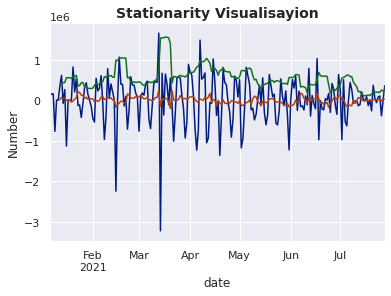

In [ ]:
stationary_test_plot(usa_vax['diff_vaccinations'])

In [ ]:
adfuller_test(usa_vax['diff_vaccinations'])

ADF Test Statistic : -3.008376842900737
p-value : 0.03411947947141374
#Lags Used : 15
Number of Observations Used : 188
The series is stationary


ARIMA - Autoregressive (p) Integrated(d) Moving Average (q)

The autoregressive model          

Identification of an AR model is often best done with the PACF.
- For an AR model, the theoretical PACF “shuts off” past the order of the model. 
- The phrase “shuts off” means that in theory the partial autocorrelations are equal to 0 beyond that point. Put another way, the number of non-zero partial autocorrelations gives the order of the AR model. 
- By the “order of the model” we mean the most extreme lag of x that is used as a predictor.

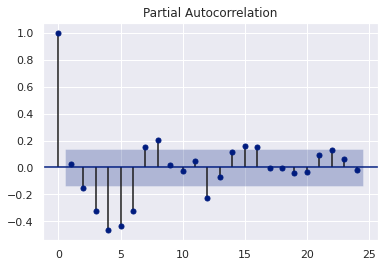

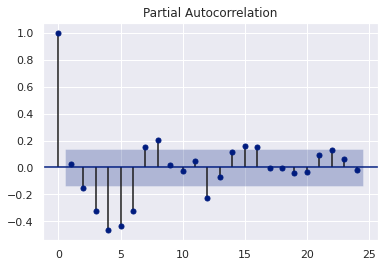

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
#plot_pacf identifies patameter p
plot_pacf(usa_vax['diff_vaccinations'])

The Moving Average (MA) Model         

dentification of an MA model is often best done with the ACF rather than the PACF.

- For an MA model, the theoretical PACF does not shut off, but instead tapers toward 0 in some manner.
-  A clearer pattern for an MA model is in the ACF. The ACF will have non-zero autocorrelations only at lags involved in the model.

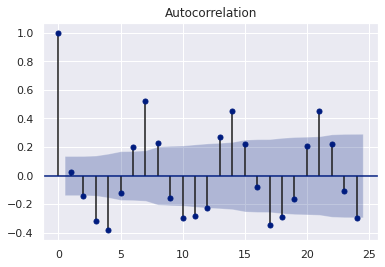

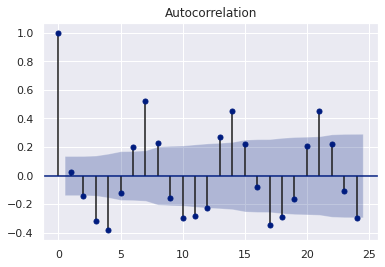

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf

#plot_acf identifies patameter q
plot_acf(usa_vax['diff_vaccinations'])

In [ ]:
from statsmodels.tsa.arima_model import ARIMA

model = ARIMA(usa_vax['vaccinations_administered'], order=(1,0,1))
arima_model_fit = model.fit()

usa_vax['arima_pred']=arima_model_fit.predict(start=141,end=204,dynamic=True)
usa_vax[['vaccinations_administered','arima_pred']].plot(figsize=(12,8))

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


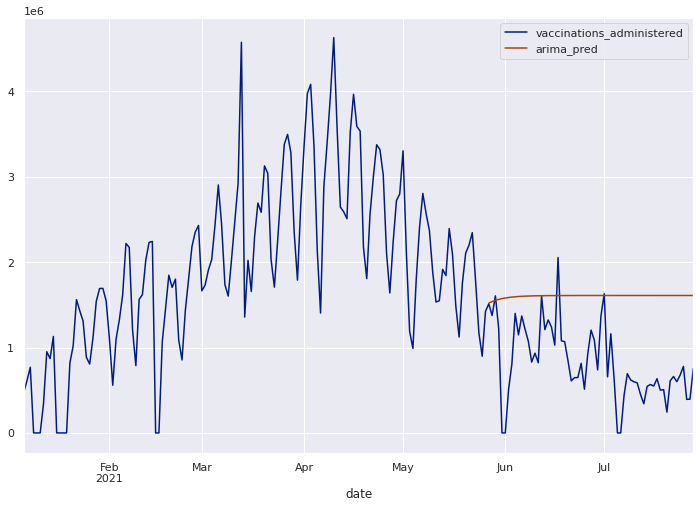

Seasonal Arima

In [ ]:
import statsmodels.api as sm

model=sm.tsa.statespace.SARIMAX(usa_vax['vaccinations_administered'],order=(1, 0, 1),seasonal_order=(1,0,1,7))
sarima_model_fit=model.fit()

usa_vax['seasonal_arima_pred']=sarima_model_fit.predict(start=141,end=204,dynamic=True)
usa_vax[['vaccinations_administered','seasonal_arima_pred']].plot(figsize=(12,8))

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  % freq, ValueWarning)


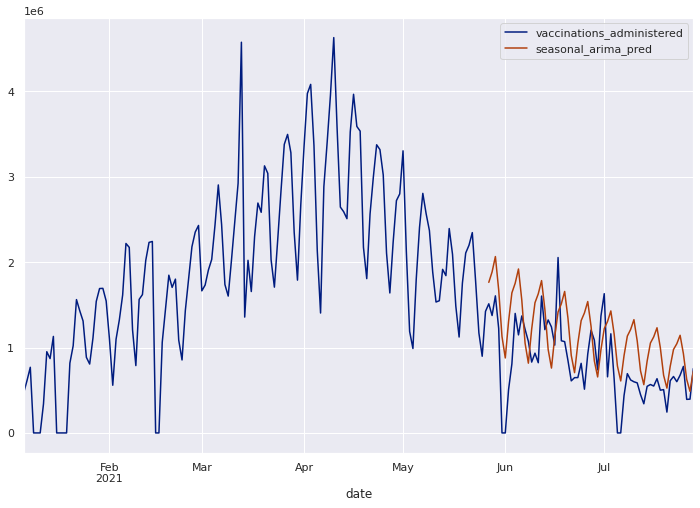

In [ ]:
arima_df = usa_vax.dropna()
from sklearn.metrics import mean_squared_error as MSE

print("ARIMA")
  # RMSE Computation
rmse = np.sqrt(MSE(arima_df['vaccinations_administered'], arima_df['arima_pred']))
print("Root Mean Squared Eroor : % f" %(rmse))

  # Calculate mean absolute percentage error (MAPE)
mape = (rmse / arima_df['seasonal_arima_pred'].to_numpy())
  # Calculate and display accuracy
err = np.mean(mape[~np.isinf(mape)])
print('Error rate:',err)
accuracy = (1-(np.mean(mape[~np.isinf(mape)])))*100
print('Accuracy: ',round(accuracy,2))

ARIMA
Root Mean Squared Eroor :  890705.005645
Error rate: 0.8635148330315479
Accuracy:  13.65


In [ ]:

from sklearn.metrics import mean_squared_error as MSE

print("Seasonal ARIMA")
  # RMSE Computation
rmse = np.sqrt(MSE(arima_df['vaccinations_administered'], arima_df['seasonal_arima_pred']))
print("Root Mean Squared Eroor : % f" %(rmse))

  # Calculate mean absolute percentage error (MAPE)
mape = (rmse / arima_df['seasonal_arima_pred'].to_numpy())
  # Calculate and display accuracy
err = np.mean(mape[~np.isinf(mape)])
print('Error rate:',err)
accuracy = (1-(np.mean(mape[~np.isinf(mape)])))*100
print('Accuracy: ',round(accuracy,2))

Seasonal ARIMA
Root Mean Squared Eroor :  491661.194540
Error rate: 0.47665246251035703
Accuracy:  52.33


Feature Selection

In [ ]:
# A list of potential features
usa_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 554 entries, 2020-01-22 to 2021-07-28
Data columns (total 29 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   iso_code                             554 non-null    object 
 1   continent                            554 non-null    object 
 2   country                              554 non-null    object 
 3   total_cases                          554 non-null    float64
 4   new_cases                            554 non-null    float64
 5   total_deaths                         554 non-null    float64
 6   new_deaths                           554 non-null    float64
 7   total_cases_per_million              554 non-null    float64
 8   new_cases_per_million                554 non-null    float64
 9   total_deaths_per_million             554 non-null    float64
 10  new_deaths_per_million               554 non-null    float64
 11  hosp_patients

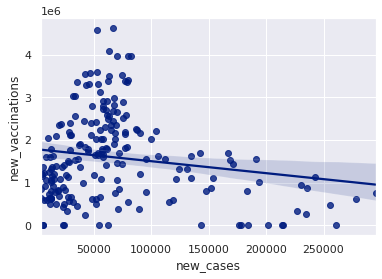

In [ ]:
# Plotting new vaccinations against new cases
sns.regplot(x='new_cases', y='new_vaccinations', data= usa_df.loc['2021-01-04':])

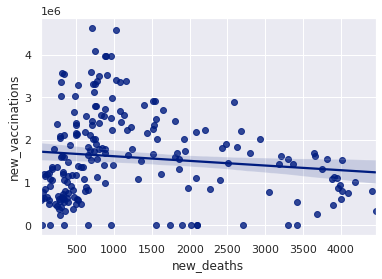

In [ ]:
# Plotting new vaccinations against new cases
sns.regplot(x='new_deaths', y='new_vaccinations', data= usa_df.loc['2021-01-04':])

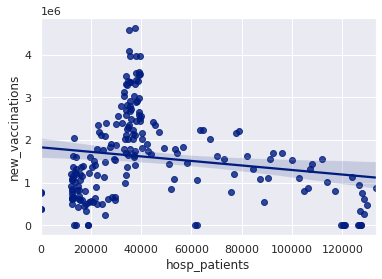

In [ ]:
# Plotting new vaccinations against hospitalised patienys.
sns.regplot(x='hosp_patients', y='new_vaccinations', data= usa_df.loc['2021-01-04':])

In [ ]:
usa_vax = usa_df.loc['2021-01-04':][['new_cases','new_deaths','hosp_patients','new_vaccinations']]
# Create a dataframe
usa_vax= pd.DataFrame(usa_vax)
usa_vax

,new_cases,new_deaths,hosp_patients,new_vaccinations
date,,,,
2021-01-04,184005.0,2094.0,127396.0,0.0
2021-01-05,235042.0,3690.0,128826.0,273209.0
2021-01-06,255637.0,3892.0,129769.0,470328.0
2021-01-07,278337.0,4004.0,128782.0,612621.0
2021-01-08,295257.0,4098.0,127854.0,768813.0
...,...,...,...,...
2021-07-24,27395.0,115.0,29596.0,676050.0
2021-07-25,16008.0,56.0,0.0,778996.0
2021-07-26,89096.0,271.0,0.0,393083.0


In [ ]:
# Calculate the correlation coefficient
x = usa_vax['new_cases']
d = usa_vax['new_deaths']
h = usa_vax['hosp_patients']
y = usa_vax['new_vaccinations']

r1 = x.corr(y)
r2= d.corr(y)
r3= h.corr(y)
print ("Cases corr coefficient: ",r1)
print ("Deaths corr coefficient: ",r2)
print ("Hospitalised patients corr coefficient: ",r3)

Cases corr coefficient:  -0.16520956842380316
Deaths corr coefficient:  -0.12404115574846716
Hospitalised patients corr coefficient:  -0.17521577183857312


Correlation coefficient of -0.17 shows that theres a moderate correlation between the new_vases and new_vaccinations. The more the number of vaccinations administered the fewer the number of cases and vice versa.             
Correlation coefficient of -0.12 shows that theres a moderate correlation between the new_deaths and new_vaccinations. The more the number of vaccinations administered the fewer the number of deaths and vice versa.
Correlation coefficient of -0.18 shows that theres a moderate correlation between the hospiyalised patients and new_vaccinations. The more the number of vaccinations administered the fewer the number of hospitalised patirnts and vice versa.




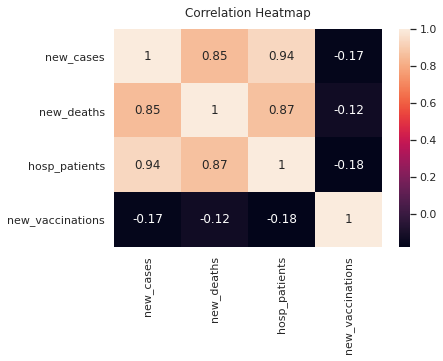

In [ ]:
heatmap= sns.heatmap(usa_vax.corr(), annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

Due to the strong positive correlation one feature has to be dropped.

In [ ]:
# Add a new id column to represent dates numerically.
usa_vax.reset_index(inplace=True)
usa_vax['id']=usa_vax.index
#usa_vax.index=usa_vax.index.to_period('D').size
usa_vax=usa_vax.drop(usa_vax.index[0],axis=0)
#usa_vax['id']=range(1,170)
usa_vax=usa_vax.reindex(columns=['date','id','hosp_patients','new_cases','new_vaccinations'])
usa_vax=usa_vax.set_index('date')
usa_vax = usa_vax.rename(columns={'hosp_patients':'hospital_admissions'})
usa_vax = usa_vax.rename(columns={'new_cases':'daily_cases'})
usa_vax = usa_vax.rename(columns={'new_vaccinations':'vaccinations_administered'})
usa_vax

,id,hospital_admissions,daily_cases,vaccinations_administered
date,,,,
2021-01-05,1,128826.0,235042.0,273209.0
2021-01-06,2,129769.0,255637.0,470328.0
2021-01-07,3,128782.0,278337.0,612621.0
2021-01-08,4,127854.0,295257.0,768813.0
2021-01-09,5,126384.0,260967.0,0.0
...,...,...,...,...
2021-07-24,201,29596.0,27395.0,676050.0
2021-07-25,202,0.0,16008.0,778996.0
2021-07-26,203,0.0,89096.0,393083.0


In [ ]:
usa_vax.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 205 entries, 2021-01-05 to 2021-07-28
Data columns (total 4 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   id                         205 non-null    int64  
 1   hospital_admissions        205 non-null    float64
 2   daily_cases                205 non-null    float64
 3   vaccinations_administered  205 non-null    float64
dtypes: float64(3), int64(1)
memory usage: 8.0 KB


Distribution and checking for outliers in features.

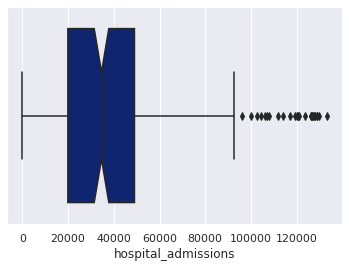

In [ ]:
sns.boxplot(usa_vax['hospital_admissions'],notch ='True')

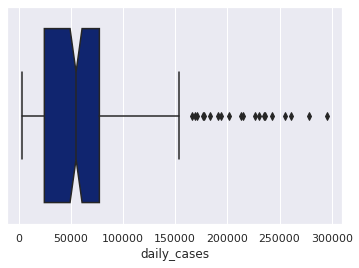

In [ ]:
sns.boxplot(usa_vax['daily_cases'],notch ='True')

In [ ]:
usa_vax.describe()

,id,hospital_admissions,daily_cases,vaccinations_administered
count,205.0,205.0,205.0,205.0
mean,103.0,43577.8,66952.2,1603167.2
std,59.3,33357.2,59924.0,1020571.8
min,1.0,0.0,3697.0,0.0
25%,52.0,19883.0,24699.0,808036.0
50%,103.0,34618.0,55077.0,1512303.0
75%,154.0,49042.0,77404.0,2231745.0
max,205.0,133214.0,295257.0,4629928.0


Feature Engineering

In [ ]:
# Stationary vaccination data
usa_vax['diff_vaccinations']=usa_vax['vaccinations_administered'].diff(periods=1)
# Adding lag variable
usa_vax['prev_day_vaccination']=usa_vax['vaccinations_administered'].shift(1)
usa_vax['prev_3_day_vaccination']=usa_vax['vaccinations_administered'].shift(3)
usa_vax['prev_6_day_vaccination']=usa_vax['vaccinations_administered'].shift(6)

# Adding smoothed variable
usa_vax['3_day_average_vaccination']=usa_vax['vaccinations_administered'].rolling(window=3).mean()

# Adding lag variable for the next day
usa_vax['next_day_vaccinations']=usa_vax['vaccinations_administered'].shift(-1)



In [ ]:

usa_vax=usa_vax.dropna(axis=0)
usa_vax.tail()

,id,hospital_admissions,daily_cases,vaccinations_administered,diff_vaccinations,prev_day_vaccination,prev_3_day_vaccination,prev_6_day_vaccination,3_day_average_vaccination,next_day_vaccinations
date,,,,,,,,,,
2021-07-23,200,29607.0,118797.0,600157.0,-60741.0,660898.0,243940.0,635290.0,624182.7,676050.0
2021-07-24,201,29596.0,27395.0,676050.0,75893.0,600157.0,611493.0,500910.0,645701.7,778996.0
2021-07-25,202,0.0,16008.0,778996.0,102946.0,676050.0,660898.0,507076.0,685067.7,393083.0
2021-07-26,203,0.0,89096.0,393083.0,-385913.0,778996.0,600157.0,243940.0,616043.0,395489.0
2021-07-27,204,0.0,70740.0,395489.0,2406.0,393083.0,676050.0,611493.0,522522.7,753984.0


prepare data

In [ ]:
features = usa_vax[['id','daily_cases','hospital_admissions','vaccinations_administered','diff_vaccinations','prev_day_vaccination','prev_6_day_vaccination','prev_3_day_vaccination','3_day_average_vaccination']].to_numpy()
labels = np.array(usa_vax['next_day_vaccinations']).reshape(-1,1)

In [ ]:
features

array([[7.00000000e+00, 2.14664000e+05, 1.27585000e+05, ...,
        2.73209000e+05, 7.68813000e+05, 0.00000000e+00],
       [8.00000000e+00, 2.26967000e+05, 1.27030000e+05, ...,
        4.70328000e+05, 0.00000000e+00, 1.13272000e+05],
       [9.00000000e+00, 2.30301000e+05, 1.26529000e+05, ...,
        6.12621000e+05, 0.00000000e+00, 4.30380000e+05],
       ...,
       [2.02000000e+02, 1.60080000e+04, 0.00000000e+00, ...,
        5.07076000e+05, 6.60898000e+05, 6.85067667e+05],
       [2.03000000e+02, 8.90960000e+04, 0.00000000e+00, ...,
        2.43940000e+05, 6.00157000e+05, 6.16043000e+05],
       [2.04000000e+02, 7.07400000e+04, 0.00000000e+00, ...,
        6.11493000e+05, 6.76050000e+05, 5.22522667e+05]])

Split into train and test

In [ ]:
# Using Skicit-learn to split data into training and testing sets
from sklearn.model_selection import train_test_split
# Split the data into training and testing sets
train_features, test_features, train_labels, test_labels = train_test_split(features, labels, test_size = 0.10, shuffle=False)

In [ ]:
#Function to visualise the model
def visualize_model (prediction):
  plt.scatter(x=range(len(test_labels)),y=test_labels, alpha=0.6,c='darkblue', label='Actual Values')
  plt.plot(prediction, marker='o', alpha=0.8, c='orange', label='Model Predictions')
  plt.legend(loc='upper left')
  plt.show()

In [ ]:
# Function to evaluare rhe models.
def evaluate_model(prediction):
  
  from sklearn.metrics import mean_squared_error as MSE

  # RMSE Computation
  rmse = np.sqrt(MSE(test_labels, prediction)
  print("Root Mean Squared Eroor : % f" %(rmse))

  # Calculate mean absolute percentage error (MAPE)
  mape = (rmse / test_labels)
  # Calculate and display accuracy
  err = np.mean(mape[~np.isinf(mape)])
  print('Error rate:',round(err,3))
  accuracy = (1-(np.mean(mape[~np.isinf(mape)])))*100
  print('Accuracy: ',round(accuracy,1))


Train the models

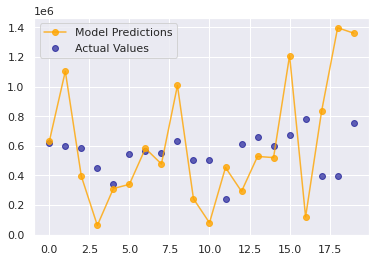

In [ ]:
from sklearn import linear_model

model = linear_model.LinearRegression()
model.fit(train_features,train_labels)
lreg_pred =model.predict(test_features)

visualize_model(lreg_pred)


In [ ]:
evaluate_model(lreg_pred)

The mean absolute value for the naive model is 322604.06647586345
RMSE :  407936.733309
Error rate: 0.7990847960433826


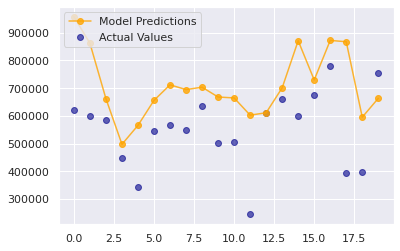

In [ ]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 1000 decision trees
rf = RandomForestRegressor(n_estimators = 1000, random_state = 42)
# Train the model on training data
rf_fit=rf.fit(train_features, train_labels)
# Use the forest's predict method on the test data
rf_pred = rf_fit.predict(test_features)

visualize_model(rf_pred)

In [ ]:
evaluate_model(rf_pred)

The base mean absolute value for the naive model is 166260.32165
RMSE :  205187.096688


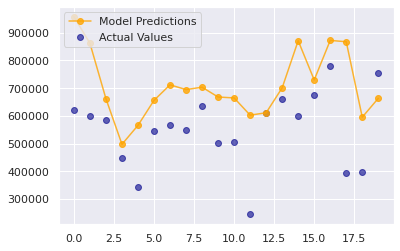

In [ ]:
# Import the model we are using
from sklearn.tree import DecisionTreeRegressor
# Instantiate model 
dtr = RandomForestRegressor(random_state = 42)
# Train the model on training data
dtr_fit=rf.fit(train_features, train_labels)
# Use the forest's predict method on the test data
dtr_pred = dtr_fit.predict(test_features)

visualize_model(dtr_pred)

In [ ]:
print("Decision Tree")
evaluate_model(dtr_pred)

Decision Tree
Root Mean Squared Eroor :  407936.733309
Error rate: 0.799
Accuracy:  20.1


In [ ]:
import xgboost as xg

# Instantiation
xgb_r = xg.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)
  
# Fitting the model
xgb_r.fit(train_features, train_labels)
  
# Make predictions
xgb_pred = xgb_r.predict(test_features)



[23:11:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


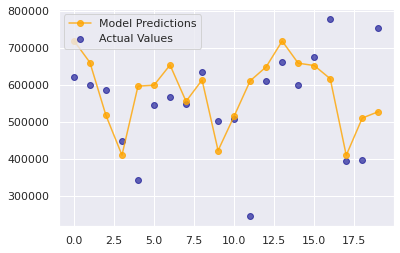

In [ ]:
visualize_model(xgb_pred)

In [ ]:
evaluate_model(xgb_pred)

The base mean absolute value for the naive model is 92170.615625
RMSE :  129726.349769
Error rate: 0.25411380070140194


In [ ]:
test_labels

array([[620612.],
       [598995.],
       [586244.],
       [449122.],
       [341466.],
       [545543.],
       [567174.],
       [549205.],
       [635290.],
       [500910.],
       [507076.],
       [243940.],
       [611493.],
       [660898.],
       [600157.],
       [676050.],
       [778996.],
       [393083.],
       [395489.],
       [753984.]])

In [ ]:
xgb_pred

array([719786.75, 660449.4 , 517309.47, 409753.  , 596564.8 , 599135.94,
       653763.25, 555358.4 , 613190.56, 422255.66, 515303.44, 610796.06,
       648717.8 , 718655.4 , 658678.3 , 652334.06, 616641.2 , 409384.1 ,
       510174.78, 527337.1 ], dtype=float32)

In [ ]:
actual=usa_vax[['vaccinations_administered','next_day_vaccinations']].tail(20)

finaldf=actual
finaldf['PREDICTED_next_day_vaccinations']=xgb_pred

finaldf.columns = ['Vaccinations_Administered','ACTUAL_next_day_vaccinations', 'PREDICTED_next_day_vaccinations']

finaldf.head(10)

,vaccinations_administered,next_day_vaccinations
date,,
2021-07-08,694333.0,620612.0
2021-07-09,620612.0,598995.0
2021-07-10,598995.0,586244.0
2021-07-11,586244.0,449122.0
2021-07-12,449122.0,341466.0
2021-07-13,341466.0,545543.0
2021-07-14,545543.0,567174.0
2021-07-15,567174.0,549205.0
2021-07-16,549205.0,635290.0


,Vaccinations_Administered,ACTUAL_next_day_vaccinations,PREDICTED_next_day_vaccinations
date,,,
2021-07-08,694333.0,620612.0,719786.8
2021-07-09,620612.0,598995.0,660449.4
2021-07-10,598995.0,586244.0,517309.5
2021-07-11,586244.0,449122.0,409753.0
2021-07-12,449122.0,341466.0,596564.8
2021-07-13,341466.0,545543.0,599135.9
2021-07-14,545543.0,567174.0,653763.2
2021-07-15,567174.0,549205.0,555358.4
2021-07-16,549205.0,635290.0,613190.6
